In [ ]:
!pip install --upgrade gensim


# Classic 
import pandas as pd
import numpy as np
import sklearn
import timeit
import os, sys,time
import string
import pickle
import time

# Viz 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import matplotlib.cm as cm

# Standardization.
from sklearn.preprocessing import StandardScaler

# ML/Clustering/PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import RobustScaler



# Error & Quality of prediction
from sklearn.metrics import accuracy_score, precision_score
from sklearn.metrics import silhouette_score, adjusted_rand_score, silhouette_samples  
from yellowbrick.cluster import SilhouetteVisualizer

# Style use
sns.set_style('whitegrid')
plt.style.use('seaborn-bright')
# init sns
sns.set()

from sklearn import cluster, metrics
from sklearn import manifold, decomposition
import logging

logging.disable(logging.WARNING) # disable WARNING, INFO and DEBUG logging everywhere


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install umap-learn
!pip install tensorflow_text

In [ ]:
# Natural Language (NLP)
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize, wordpunct_tokenize, RegexpTokenizer,sent_tokenize
from nltk.corpus import words, stopwords
#lemmatisation ou racinisation (stemming)
from nltk.stem.snowball import EnglishStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


import spacy
from spacy.lang.en import English

from umap import UMAP

In [ ]:
from nltk.stem.snowball import EnglishStemmer
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('words')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [ ]:
import tensorflow as tf
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim

from wordcloud import WordCloud
from PIL import Image

In [ ]:

gensim.__version__

'4.2.0'

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving flipkart_com-ecommerce_sample_1050.csv to flipkart_com-ecommerce_sample_1050 (1).csv


In [ ]:
df = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')
print(" la taille de dataset : ", df.shape)
df.head(3)

 la taille de dataset :  (1050, 15)


,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",..."


In [ ]:
df.isna().sum()

uniq_id                      0
crawl_timestamp              0
product_url                  0
product_name                 0
product_category_tree        0
pid                          0
retail_price                 1
discounted_price             1
image                        0
is_FK_Advantage_product      0
description                  0
product_rating               0
overall_rating               0
brand                      338
product_specifications       1
dtype: int64

# Nettoyage catégories

In [ ]:
print("nombre de uniq id : " ,  df['uniq_id'].nunique())
print("nombre de duplicated uniq id: ", df.duplicated('uniq_id').sum())
print("nombre de category produit :" , df['product_category_tree'].nunique())

nombre de uniq id :  1050
nombre de duplicated uniq id:  0
nombre de category produit : 642


##  Extraction de la catégorie à partir de product_category_tree

In [ ]:
# Détermination de la profondeur maximale de l'arborescence des catégories
depth_tree_cat = df['product_category_tree'].apply(lambda x: x.count('>>'))
max_depth = depth_tree_cat.max()
print("la profondeur maximale de l'arborescence des catégories :", max_depth)

la profondeur maximale de l'arborescence des catégories : 6


In [ ]:
# Cette fonction permet de retourner la catégorie du produit (de niveau 1) dont on donne le category_tree L en entrée.
def get_categ(L):   
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            break
        categ+='{} '.format(i)     
    return categ    

# Cette fonction permet de retourner la catégorie du produit (de niveau 2) dont on donne le category_tree L en entrée.  
def get_categ2(L): 
    c = 0 
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            c+=1     
        if c == 2:
            break        
        if c == 1 :     
            categ+='{} '.format(i)
    size = len(categ) - 1  
    return categ[3:size]  

# Cette fonction permet de retourner la catégorie du produit (de niveau 3) dont on donne le category_tree L en entrée.  
def get_categ3(L): 
    c = 0
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            c+=1    
        if c == 3:
            break         
        if c == 2 :     
            categ+='{} '.format(i)  
    size = len(categ) - 1  
    return categ[3:size] 
  
# Cette fonction permet de retourner la catégorie du produit (de niveau 4) dont on donne le category_tree L en entrée.  
def get_categ4(L): 
    c = 0
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            c+=1    
        if c == 4:
            break         
        if c == 3 :     
            categ+='{} '.format(i)  
    size = len(categ) - 1  
    return categ[3:size]


# Cette fonction permet de retourner la catégorie du produit (de niveau 5) dont on donne le category_tree L en entrée.  
def get_categ5(L): 
    c = 0
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            c+=1    
        if c == 5:
            break         
        if c == 4 :     
            categ+='{} '.format(i)  
    size = len(categ) - 1  
    return categ[3:size]

# Cette fonction permet de retourner la catégorie du produit (de niveau 6) dont on donne le category_tree L en entrée.  
def get_categ6(L): 
    c = 0
    split_tree = str.split(L[2:])
    categ = ''  
    for i in split_tree:
        if i == '>>':
            c+=1    
        if c == 6:
            break         
        if c == 4 :     
            categ+='{} '.format(i)  
    size = len(categ) - 1  
    return categ[3:size]

In [ ]:
# Création de la colonne catégorie et catégorie 2.
df['product_category_level_1'] = df['product_category_tree'].apply(lambda x : get_categ(x))
df['product_category_level_2'] = df['product_category_tree'].apply(lambda x : get_categ2(x))
df['product_category_level_3'] = df['product_category_tree'].apply(lambda x : get_categ3(x))
df['product_category_level_4'] = df['product_category_tree'].apply(lambda x : get_categ4(x))
df['product_category_level_5'] = df['product_category_tree'].apply(lambda x : get_categ5(x))
df['product_category_level_6'] = df['product_category_tree'].apply(lambda x : get_categ6(x))

df.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,...,product_rating,overall_rating,brand,product_specifications,product_category_level_1,product_category_level_2,product_category_level_3,product_category_level_4,product_category_level_5,product_category_level_6
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,Elegance Polyester Multicolor Abstract Eyelet ...,,
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Sathiyas Baby Bath Towels,"Sathiyas Cotton Bath Towel (3 Bath Towel, Red,...","Sathiyas Cotton Bath Towel (3 Bath Towel, Red,..."
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels,Eurospa Baby Bath Towels,Eurospa Cotton Terry Face Towel Set (20 PIECE ...,Eurospa Cotton Terry Face Towel Set (20 PIECE ...


In [ ]:
df['product_category_level_1'].unique()

array(['Home Furnishing ', 'Baby Care ', 'Watches ',
       'Home Decor & Festive Needs ', 'Kitchen & Dining ',
       'Beauty and Personal Care ', 'Computers '], dtype=object)

In [ ]:
df.groupby('product_category_level_1')['product_category_level_1'].count()

product_category_level_1
Baby Care                      150
Beauty and Personal Care       150
Computers                      150
Home Decor & Festive Needs     150
Home Furnishing                150
Kitchen & Dining               150
Watches                        150
Name: product_category_level_1, dtype: int64

Text(0, 0.5, 'Nombre de produits')

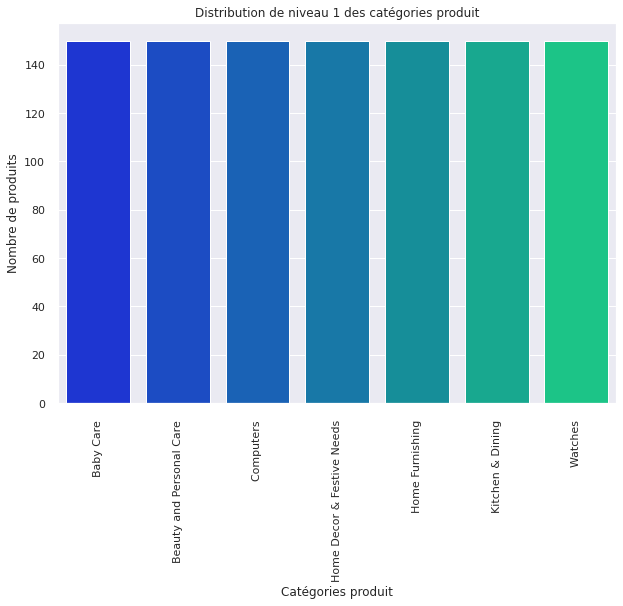

In [ ]:
# Compte des catégories produits de niveau 1 sur le dataset.
(fig, ax) = plt.subplots(figsize=(10, 7))
plt.title('Distribution de niveau 1 des catégories produit')
plt.xticks(rotation = 90)
sns.barplot(x=df.groupby('product_category_level_1').size().index, 
            y=df.groupby('product_category_level_1').size(), 
            palette='winter')
plt.xlabel('Catégories produit')
plt.ylabel('Nombre de produits')

In [ ]:
df['product_category_level_2'].unique()

array(['Curtains & Accessories', 'Baby Bath & Skin', 'Bed Linen',
       'Wrist Watches', 'Living Room Furnishing', 'Bath Linen',
       'Candles & Fragrances', 'Tableware & Cutlery', 'Lighting',
       'JMD Home Furnishing', 'Infant Wear', "Kripa's Home Furnishing",
       'Hair Care', 'Coffee Mugs', 'Network Components',
       'Tablet Accessories', 'Cookware', 'Laptop Accessories', 'Makeup',
       'Combos and Kits', 'Feeding & Nursing', 'Baby Bedding',
       'Kitchen & Dining Linen', 'Containers & Bottles',
       'Consumables & Disposables', 'Wall Decor & Clocks',
       'Table Decor & Handicrafts', 'Flowers, Plants & Vases', 'Software',
       'Showpieces', 'Furniture & Furnishings',
       'Decorative Lighting & Lamps', 'Baby Grooming',
       'Computer Peripherals', 'Cushions, Pillows & Covers', 'Storage',
       'Health Care', 'Body and Skin Care', 'Kitchen Tools',
       'TRUE Home Decor & Festive Needs"]', 'Living', 'Showpiece',
       'Bar & Glassware', 'Fragrances', "Wome

In [ ]:
df.groupby('product_category_level_2')['product_category_level_2'].count()

product_category_level_2
Baby & Kids Gifts        15
Baby Bath & Skin         14
Baby Bedding             15
Baby Grooming             4
Bar & Glassware           8
                       ... 
Tableware & Cutlery       3
Tidy Home Furnishing      1
Wall Decor & Clocks      22
Women's Hygiene           1
Wrist Watches           149
Name: product_category_level_2, Length: 63, dtype: int64

Text(0, 0.5, 'Nombre de produits')

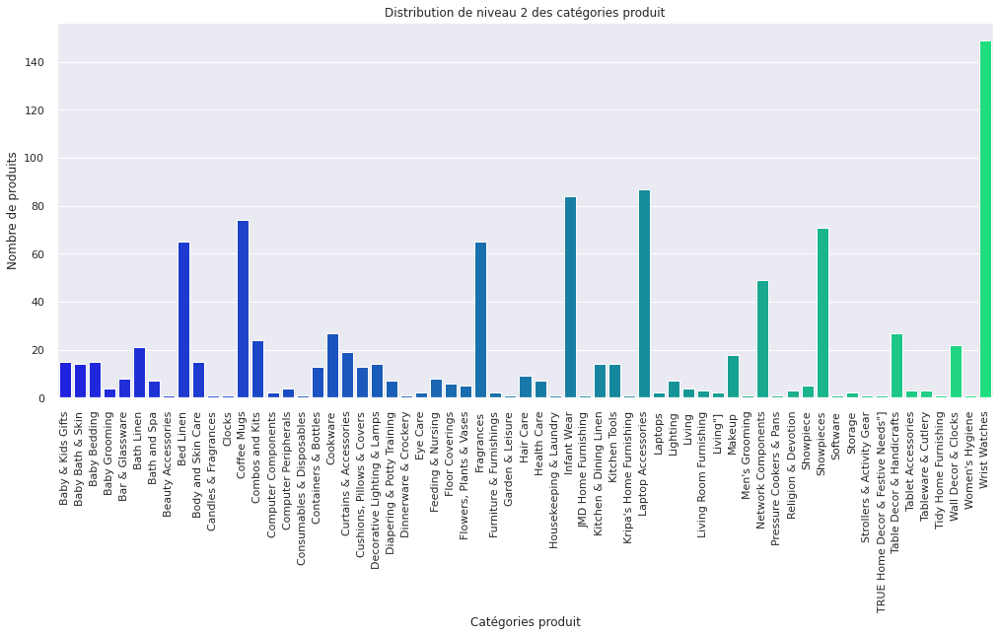

In [ ]:
# Compte des catégories produits de niveau 2 sur le dataset.
(fig, ax) = plt.subplots(figsize=(17, 7))
plt.title('Distribution de niveau 2 des catégories produit')
plt.xticks(rotation = 90)
sns.barplot(x=df.groupby('product_category_level_2').size().index, 
            y=df.groupby('product_category_level_2').size(), 
            palette='winter')
plt.xlabel('Catégories produit')
plt.ylabel('Nombre de produits')

In [ ]:
df['product_category_level_3'].unique()

array(['Curtains', 'Baby Bath Towels', 'Bedsheets',
       'Maserati Time Wrist Watches"]', 'Camerii Wrist Watches"]',
       'T STAR Wrist Watches"]', 'Alfajr Wrist Watches"]',
       'TAG Heuer Wrist Watches"]', 'Calibro Wrist Watches"]',
       'Cartier Wrist Watches"]', 'Lois Caron Wrist Watches"]',
       'Titan Wrist Watches"]', 'Srushti Art Jewelry Wrist Watches"]',
       'Escort Wrist Watches"]', 'Jack klein Wrist Watches"]',
       'North Moon Wrist Watches"]', 'Franck Bella Wrist Watches"]',
       'Ridas Wrist Watches"]', 'Skmei Wrist Watches"]',
       'Now Wrist Watches"]', 'fastrack Wrist Watches"]',
       'Disney Wrist Watches"]', 'Vizion Wrist Watches"]',
       'Elantra Wrist Watches"]', 'Marvel Wrist Watches"]',
       'Lenco Wrist Watches"]', 'D\'Signer Wrist Watches"]', 'Diwan Sets',
       'Duvet Covers', 'Bath Mats"]', 'Home Fragrances',
       'Jug, Glass & Tray Sets', 'Bulbs',
       'JMD Printed Cushions Cover (Pack of 2, 40 cm*40 ..."]',
       "Baby Girls' 

In [ ]:
df.groupby('product_category_level_3')['product_category_level_3'].count()

product_category_level_3
                                         3
AKUP Coffee Mugs                         5
AM Creation Coffee Mugs                  1
Aapno Rajasthan Showpieces"]             2
Adaa Showpieces"]                        1
                                        ..
brass gift center Religion & Devotion    1
eCraftIndia Showpieces"]                 1
fastrack Wrist Watches"]                 1
palito Wrist Watches                     3
posterchacha Coffee Mugs                 1
Name: product_category_level_3, Length: 247, dtype: int64

Text(0, 0.5, 'Nombre de produits')

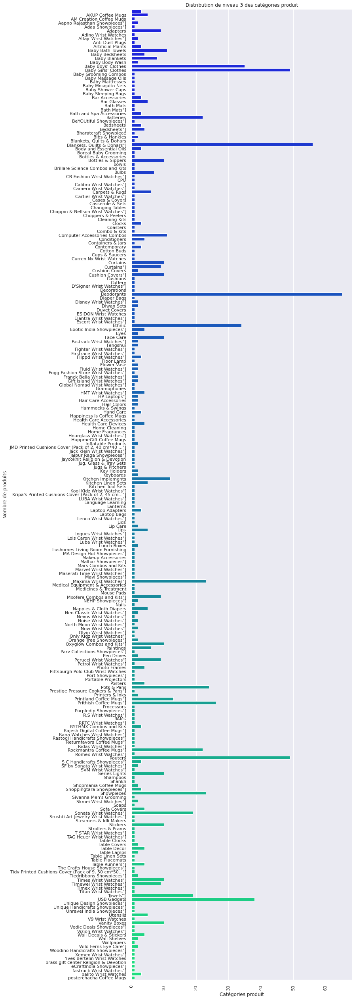

In [ ]:
# Compte des catégories produits de niveau 3 sur le dataset.
(fig, ax) = plt.subplots(figsize=(10, 45))
plt.title('Distribution de niveau 3 des catégories produit')
plt.xticks(rotation = 90)
sns.barplot(y=df.groupby('product_category_level_3').size().index, 
            x=df.groupby('product_category_level_3').size(), 
            palette='winter')
plt.xlabel('Catégories produit')
plt.ylabel('Nombre de produits')

In [ ]:
print("nombre de produit :" ,df["product_name"].nunique())


nombre de produit : 1050


Text(0.5, 1.0, 'Distribution de la taille des descriptions produits')

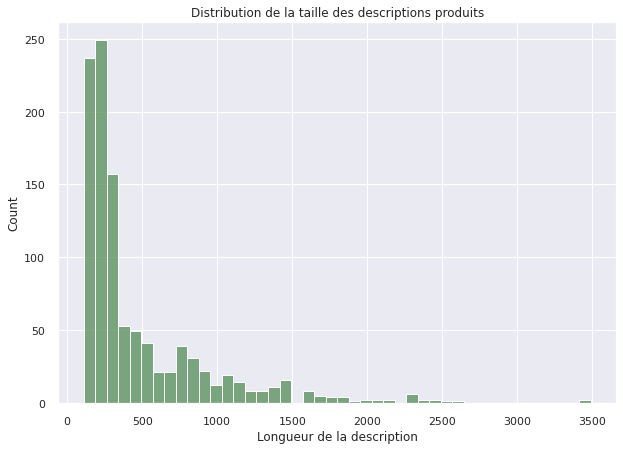

In [ ]:
# Check de la longueur des descriptions produits.
length_description = []
for i in df['description']:
    length_description.append(len(i))

(fig, ax) = plt.subplots(figsize=(10, 7))    
sns.histplot(length_description, color='#548e57')    
plt.xlabel('Longueur de la description')
plt.title('Distribution de la taille des descriptions produits')

In [ ]:
# creation of a corpus of all the descriptions
df_cat = pd.DataFrame()
df_cat["product_name"] = df["product_name"]
df_cat["description"] = df["description"]
df_cat["product_descriptiion"] = df['product_name'] + '.' + df['description']
df_cat["product_category"] = df["product_category_level_1"]
corpus = ' '.join(df_cat["product_descriptiion"].values)
display(df_cat.head(3), df_cat.shape)

,product_name,description,product_descriptiion,product_category
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,Elegance Polyester Multicolor Abstract Eyelet ...,Home Furnishing
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,Sathiyas Cotton Bath Towel.Specifications of S...,Baby Care
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,Eurospa Cotton Terry Face Towel Set.Key Featur...,Baby Care


(1050, 4)

In [ ]:
print("total nb of words in the whole corpus: ",len(corpus))

total nb of words in the whole corpus:  546968


## Nettoyage du texte

In [ ]:
df_cat["product_descriptiion"] = df_cat["product_descriptiion"].apply(lambda x: x.lower())


# Preprocessing function (text)

In [ ]:
import re
from nltk.stem import WordNetLemmatizer
stopword_en = set(nltk.corpus.stopwords.words('english'))
stemmer = WordNetLemmatizer()

def preprocess_text(document):
        # Remove all the special characters
        document = re.sub(r'\W', ' ', str(document))

        # remove all single characters
        document = re.sub(r'\s+[a-zA-Z]\s+', ' ', document)

        # Remove single characters from the start
        document = re.sub(r'\^[a-zA-Z]\s+', ' ', document)

        # Substituting multiple spaces with single space
        document = re.sub(r'\s+', ' ', document, flags=re.I)

        # Converting to Lowercase
        document = document.lower()

        # Lemmatization
        tokens = document.split()
        tokens = [stemmer.lemmatize(word) for word in tokens]
        tokens = [word for word in tokens if word not in stopword_en]
        tokens = [word for word in tokens if len(word) > 3]

        preprocessed_text = ' '.join(tokens)
        
        return preprocessed_text

In [ ]:
df1 = df_cat.copy()

In [ ]:
df_cat['corpus'] = df_cat['product_descriptiion'] + ' ' + df_cat['product_category'] 
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...


In [ ]:
final_corpus = [preprocess_text(sentence) for sentence in df_cat['corpus'] if str(sentence).strip() !='']
final_corpus[0]


'elegance polyester multicolor abstract eyelet door curtain feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain height pack price curtain enhances look interior curtain made high quality polyester fabric feature eyelet style stitch metal ring make room environment romantic loving curtain wrinkle anti shrinkage elegant apparance give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright want wish good morning whole world draw close evening create special moment joyous beauty given soothing print bring home elegant curtain softly filter light room right amount sunlight specification elegance polyester multicolor abstract eyelet door curtain height pack general brand elegance designed door type eyelet model name abstract polyester door curtain model duster25 color multicolor dimension le

In [ ]:
text = df_cat["corpus"]
text

0       elegance polyester multicolor abstract eyelet ...
1       sathiyas cotton bath towel.specifications of s...
2       eurospa cotton terry face towel set.key featur...
3       santosh royal fashion cotton printed king size...
4       jaipur print cotton floral king sized double b...
                              ...                        
1045    oren empower extra large self adhesive sticker...
1046    wallmantra large vinyl sticker sticker.wallman...
1047    uberlyfe extra large pigmented polyvinyl films...
1048    wallmantra medium vinyl sticker sticker.buy wa...
1049    uberlyfe large vinyl sticker.buy uberlyfe larg...
Name: corpus, Length: 1050, dtype: object

## Tokenization

In [ ]:
df_cat['tokenized'] = df_cat['corpus'].apply(word_tokenize)
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d..."


## Stopword

In [ ]:
from string import punctuation
stopwords = set(nltk.corpus.stopwords.words('english'))
stopwords = stopwords.union(punctuation)
stopwords

{'!',
 '"',
 '#',
 '$',
 '%',
 '&',
 "'",
 '(',
 ')',
 '*',
 '+',
 ',',
 '-',
 '.',
 '/',
 ':',
 ';',
 '<',
 '=',
 '>',
 '?',
 '@',
 '[',
 '\\',
 ']',
 '^',
 '_',
 '`',
 'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'need

In [ ]:
df_cat['stopwords_removed'] = df_cat['tokenized'].apply(lambda x: [word for word in x if word not in stopwords])
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d..."


### Stemming
### PorterStemmer

In [ ]:
from nltk.stem import PorterStemmer

def porter_stemmer(text):
    """
        Stem words in list of tokenized words with PorterStemmer
    """
    stemmer = nltk.PorterStemmer()
    stems = [stemmer.stem(i) for i in text]
    return stems

In [ ]:
df_cat['porter_stemmer'] = df_cat['stopwords_removed'].apply(lambda x: porter_stemmer(x))
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed,porter_stemmer
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...","[sathiya, cotton, bath, towel.specif, sathiya,..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, size, do..."


SnowballStemmer

In [ ]:
from nltk.stem import SnowballStemmer

def snowball_stemmer(text):
    """
        Stem words in list of tokenized words with SnowballStemmer
    """
    stemmer = nltk.SnowballStemmer("english")
    stems = [stemmer.stem(i) for i in text]
    return stems

In [ ]:
df_cat['snowball_stemmer'] = df_cat['stopwords_removed'].apply(lambda x: snowball_stemmer(x))
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specif, sathiya,..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,...","[santosh, royal, fashion, cotton, print, king,..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, size, do...","[jaipur, print, cotton, floral, king, size, do..."


LancasterStemmer

In [ ]:
from nltk.stem import LancasterStemmer

def lancaster_stemmer(text):
    """
        Stem words in list of tokenized words with LancasterStemmer
    """
    stemmer = nltk.LancasterStemmer()
    stems = [stemmer.stem(i) for i in text]
    return stems

In [ ]:
df_cat['lancaster_stemmer'] = df_cat['stopwords_removed'].apply(lambda x: lancaster_stemmer(x))
df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer,lancaster_stemmer
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicol, abstract, eyelet, do..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specifications, ..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurosp, cotton, terry, fac, towel, set.key, f..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,...","[santosh, royal, fashion, cotton, print, king,...","[santosh, roy, fash, cotton, print, king, siz,..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, size, do...","[jaipur, print, cotton, floral, king, size, do...","[jaip, print, cotton, flor, king, siz, doubl, ..."


POS Tagging
*   pos_tag/ DefaultTagger
*   UnigramTagger
*   BigramTagger

In [ ]:
nltk.download('brown')

[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Package brown is already up-to-date!


True

In [ ]:
from nltk.corpus import wordnet
from nltk.corpus import brown

wordnet_map = {"N":wordnet.NOUN, 
               "V":wordnet.VERB, 
               "J":wordnet.ADJ, 
               "R":wordnet.ADV
              }
    
train_sents = brown.tagged_sents(categories='news')
t0 = nltk.DefaultTagger('NN')
t1 = nltk.UnigramTagger(train_sents, backoff=t0)
t2 = nltk.BigramTagger(train_sents, backoff=t1)

def pos_tag_wordnet(text, pos_tag_type="pos_tag"):
    """
        Create pos_tag with wordnet format
    """
    pos_tagged_text = t2.tag(text)
    
    # map the pos tagging output with wordnet output 
    pos_tagged_text = [(word, wordnet_map.get(pos_tag[0])) if pos_tag[0] in wordnet_map.keys() else (word, wordnet.NOUN) for (word, pos_tag) in pos_tagged_text ]
    return pos_tagged_text

In [ ]:
pos_tag_wordnet(df_cat['stopwords_removed'][1])

[('sathiyas', 'n'),
 ('cotton', 'n'),
 ('bath', 'n'),
 ('towel.specifications', 'n'),
 ('sathiyas', 'n'),
 ('cotton', 'n'),
 ('bath', 'n'),
 ('towel', 'n'),
 ('3', 'n'),
 ('bath', 'n'),
 ('towel', 'n'),
 ('red', 'a'),
 ('yellow', 'a'),
 ('blue', 'a'),
 ('bath', 'n'),
 ('towel', 'n'),
 ('features', 'v'),
 ('machine', 'n'),
 ('washable', 'n'),
 ('yes', 'n'),
 ('material', 'n'),
 ('cotton', 'n'),
 ('design', 'n'),
 ('self', 'n'),
 ('design', 'n'),
 ('general', 'n'),
 ('brand', 'n'),
 ('sathiyas', 'n'),
 ('type', 'n'),
 ('bath', 'n'),
 ('towel', 'n'),
 ('gsm', 'n'),
 ('500', 'n'),
 ('model', 'n'),
 ('name', 'n'),
 ('sathiyas', 'n'),
 ('cotton', 'n'),
 ('bath', 'n'),
 ('towel', 'n'),
 ('ideal', 'a'),
 ('men', 'n'),
 ('women', 'n'),
 ('boys', 'n'),
 ('girls', 'n'),
 ('model', 'n'),
 ('id', 'n'),
 ('asvtwl322', 'n'),
 ('color', 'n'),
 ('red', 'a'),
 ('yellow', 'a'),
 ('blue', 'a'),
 ('size', 'n'),
 ('mediam', 'n'),
 ('dimensions', 'n'),
 ('length', 'n'),
 ('30', 'n'),
 ('inch', 'n'),
 ('width

In [ ]:
df_cat['combined_postag_wnet'] = df_cat['stopwords_removed'].apply(lambda x: pos_tag_wordnet(x))

df_cat.head()

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer,lancaster_stemmer,combined_postag_wnet
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicol, abstract, eyelet, do...","[(elegance, n), (polyester, n), (multicolor, n..."
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specifications, ...","[(sathiyas, n), (cotton, n), (bath, n), (towel..."
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurosp, cotton, terry, fac, towel, set.key, f...","[(eurospa, n), (cotton, n), (terry, n), (face,..."
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,...","[santosh, royal, fashion, cotton, print, king,...","[santosh, roy, fash, cotton, print, king, siz,...","[(santosh, n), (royal, a), (fashion, n), (cott..."
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, size, do...","[jaipur, print, cotton, floral, king, size, do...","[jaip, print, cotton, flor, king, siz, doubl, ...","[(jaipur, n), (print, n), (cotton, n), (floral..."


### Lemmatization

In [ ]:

def lemmatize_word(text):
    lemmatizer = WordNetLemmatizer()
    lemma = [lemmatizer.lemmatize(word, tag) for word, tag in text]
    return lemma

In [ ]:
# Test without POS Tagging
lemmatizer = WordNetLemmatizer()

df_cat['lemmatize_word_wo_pos'] = df_cat['stopwords_removed'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x])
df_cat['lemmatize_word_wo_pos'] = df_cat['lemmatize_word_wo_pos'].apply(lambda x: [word for word in x if word not in stopwords])

# Test with POS Tagging
lemmatizer = WordNetLemmatizer()

df_cat['lemmatize_word_w_pos'] = df_cat['combined_postag_wnet'].apply(lambda x: lemmatize_word(x))
df_cat['lemmatize_word_w_pos'] = df_cat['lemmatize_word_w_pos'].apply(lambda x: [word for word in x if word not in stopwords]) # double check to remove stop words
df_cat['lemmatize_text'] = [' '.join(map(str, l)) for l in df_cat['lemmatize_word_w_pos']] # join back to text

df_cat.head(5)

,product_name,description,product_descriptiion,product_category,corpus,tokenized,stopwords_removed,porter_stemmer,snowball_stemmer,lancaster_stemmer,combined_postag_wnet,lemmatize_word_wo_pos,lemmatize_word_w_pos,lemmatize_text
0,Elegance Polyester Multicolor Abstract Eyelet ...,Key Features of Elegance Polyester Multicolor ...,elegance polyester multicolor abstract eyelet ...,Home Furnishing,elegance polyester multicolor abstract eyelet ...,"[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicolor, abstract, eyelet, ...","[eleg, polyest, multicol, abstract, eyelet, do...","[(elegance, n), (polyester, n), (multicolor, n...","[elegance, polyester, multicolor, abstract, ey...","[elegance, polyester, multicolor, abstract, ey...",elegance polyester multicolor abstract eyelet ...
1,Sathiyas Cotton Bath Towel,Specifications of Sathiyas Cotton Bath Towel (...,sathiyas cotton bath towel.specifications of s...,Baby Care,sathiyas cotton bath towel.specifications of s...,"[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specif, sathiya,...","[sathiya, cotton, bath, towel.specifications, ...","[(sathiyas, n), (cotton, n), (bath, n), (towel...","[sathiyas, cotton, bath, towel.specifications,...","[sathiyas, cotton, bath, towel.specifications,...",sathiyas cotton bath towel.specifications sath...
2,Eurospa Cotton Terry Face Towel Set,Key Features of Eurospa Cotton Terry Face Towe...,eurospa cotton terry face towel set.key featur...,Baby Care,eurospa cotton terry face towel set.key featur...,"[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurospa, cotton, terri, face, towel, set.key,...","[eurosp, cotton, terry, fac, towel, set.key, f...","[(eurospa, n), (cotton, n), (terry, n), (face,...","[eurospa, cotton, terry, face, towel, set.key,...","[eurospa, cotton, terry, face, towel, set.key,...",eurospa cotton terry face towel set.key featur...
3,SANTOSH ROYAL FASHION Cotton Printed King size...,Key Features of SANTOSH ROYAL FASHION Cotton P...,santosh royal fashion cotton printed king size...,Home Furnishing,santosh royal fashion cotton printed king size...,"[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,...","[santosh, royal, fashion, cotton, print, king,...","[santosh, roy, fash, cotton, print, king, siz,...","[(santosh, n), (royal, a), (fashion, n), (cott...","[santosh, royal, fashion, cotton, printed, kin...","[santosh, royal, fashion, cotton, print, king,...",santosh royal fashion cotton print king sized ...
4,Jaipur Print Cotton Floral King sized Double B...,Key Features of Jaipur Print Cotton Floral Kin...,jaipur print cotton floral king sized double b...,Home Furnishing,jaipur print cotton floral king sized double b...,"[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, size, do...","[jaipur, print, cotton, floral, king, size, do...","[jaip, print, cotton, flor, king, siz, doubl, ...","[(jaipur, n), (print, n), (cotton, n), (floral...","[jaipur, print, cotton, floral, king, sized, d...","[jaipur, print, cotton, floral, king, sized, d...",jaipur print cotton floral king sized double b...


### Text Features Extraction

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

def cv(data, ngram = 1, MAX_NB_WORDS = 75000):
    count_vectorizer = CountVectorizer(ngram_range = (ngram, ngram), max_features = MAX_NB_WORDS)
    emb = count_vectorizer.fit_transform(data).toarray()
    print("count vectorize with", str(np.array(emb).shape[1]), "features")
    return emb, count_vectorizer

In [ ]:
def print_out(emb, feat, ngram, compared_sentence=0):
    print(ngram,"bag-of-words: ")
    print(feat.get_feature_names(), "\n")
    print(ngram,"bag-of-feature: ")
    print(test_cv_1gram.vocabulary_, "\n")
    print("BoW matrix:")
    print(pd.DataFrame(emb.transpose(), index = feat.get_feature_names()).head(), "\n")
    print(ngram,"vector example:")
    print(df_cat["lemmatize_text"][compared_sentence])
    print(emb[compared_sentence], "\n")

In [ ]:
test_corpus = df_cat["lemmatize_text"].tolist()
print("The test corpus: ", test_corpus, "\n")

test_cv_em_1gram, test_cv_1gram = cv(test_corpus, ngram=1)
print_out(test_cv_em_1gram, test_cv_1gram, ngram="Uni-gram")

The test corpus:  ['elegance polyester multicolor abstract eyelet door curtain.key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 price r 899 curtain enhances look interiors.this curtain make 100 high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty give soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 general brand elegance design door type eyelet mode

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
test_cv_em_2gram, test_cv_2gram = cv(test_corpus, ngram=2)
print_out(test_cv_em_2gram, test_cv_2gram, ngram="Bi-gram")

count vectorize with 21346 features
Bi-gram bag-of-words: 
['00 type', '000 sq', '001 material', '001 usb', '0021 box', '004 color', '005 bk', '005 fk', '006 analog', '006 online', '0083 shade', '01 analog', '01 filling', '01 kitchen', '01 mly2015', '01 online', '01 type', '011 pk', '01433cmgy gold', '01433cmgy online', '01727lpln mac', '01727lpln online', '01741lpln analog', '01741lpln online', '01784bmly gold', '01784bmly online', '02 pattern', '02 type', '03 pillow', '03 stem', '03918cmly analog', '03918cmly online', '04 300', '04 kg', '04 specifications', '04 type', '04615cmgy gold', '04615cmgy online', '050 warning', '052 plain', '05712lmly analog', '05712lmly online', '05tg 166', '05tg 870', '06 22', '06 600', '06 bag', '06 fully', '06 key', '06 pack', '06 type', '063 natural', '06362cmgy gold', '06362cmgy online', '064 create', '069 gorgeous', '07 feature', '07034lmli attivo', '07034lmli online', '074 inch', '08 cm', '085 fine', '085 lovely', '09 color', '09321cmgy gold', '09321

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
test_cv_em_3gram, test_cv_3gram = cv(test_corpus, ngram=3)
print_out(test_cv_em_2gram, test_cv_2gram, ngram="Tri-gram")

count vectorize with 28816 features
Tri-gram bag-of-words: 
['00 type', '000 sq', '001 material', '001 usb', '0021 box', '004 color', '005 bk', '005 fk', '006 analog', '006 online', '0083 shade', '01 analog', '01 filling', '01 kitchen', '01 mly2015', '01 online', '01 type', '011 pk', '01433cmgy gold', '01433cmgy online', '01727lpln mac', '01727lpln online', '01741lpln analog', '01741lpln online', '01784bmly gold', '01784bmly online', '02 pattern', '02 type', '03 pillow', '03 stem', '03918cmly analog', '03918cmly online', '04 300', '04 kg', '04 specifications', '04 type', '04615cmgy gold', '04615cmgy online', '050 warning', '052 plain', '05712lmly analog', '05712lmly online', '05tg 166', '05tg 870', '06 22', '06 600', '06 bag', '06 fully', '06 key', '06 pack', '06 type', '063 natural', '06362cmgy gold', '06362cmgy online', '064 create', '069 gorgeous', '07 feature', '07034lmli attivo', '07034lmli online', '074 inch', '08 cm', '085 fine', '085 lovely', '09 color', '09321cmgy gold', '0932

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
# implement into the whole dataset
train_df_corpus = df_cat["lemmatize_text"].tolist()
train_df_em_1gram, vc_1gram = cv(train_df_corpus, 1)
train_df_em_2gram, vc_2gram = cv(train_df_corpus, 2)
train_df_em_3gram, vc_3gram = cv(train_df_corpus, 3)

print(len(train_df_corpus))
print(train_df_em_1gram.shape)
print(train_df_em_2gram.shape)
print(train_df_em_3gram.shape)

count vectorize with 5426 features
count vectorize with 21346 features
count vectorize with 28816 features
1050
(1050, 5426)
(1050, 21346)
(1050, 28816)


In [ ]:
#del train_df_em_1gram, train_df_em_2gram, train_df_em_3gram

# Encodage du texte avec TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

def TFIDF(data, ngram = 1, MAX_NB_WORDS = 75000):
    tfidf_x = TfidfVectorizer(ngram_range = (ngram, ngram), max_features = MAX_NB_WORDS)
    emb = tfidf_x.fit_transform(data).toarray()
    print("tf-idf with", str(np.array(emb).shape[1]), "features")
    return emb, tfidf_x

In [ ]:
test_corpus = df_cat["lemmatize_text"].tolist()
print("The test corpus: ", test_corpus, "\n")

test_tfidf_em_1gram, test_tfidf_1gram = TFIDF(test_corpus, ngram=1)
print_out(test_tfidf_em_1gram, test_tfidf_1gram, ngram="Uni-gram")

The test corpus:  ['elegance polyester multicolor abstract eyelet door curtain.key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 price r 899 curtain enhances look interiors.this curtain make 100 high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty give soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 general brand elegance design door type eyelet mode

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
test_tfidf_em_2gram, test_tfidf_2gram = TFIDF(test_corpus, ngram=2)
print_out(test_tfidf_em_2gram, test_tfidf_2gram, ngram="Bi-gram")

tf-idf with 21346 features
Bi-gram bag-of-words: 
['00 type', '000 sq', '001 material', '001 usb', '0021 box', '004 color', '005 bk', '005 fk', '006 analog', '006 online', '0083 shade', '01 analog', '01 filling', '01 kitchen', '01 mly2015', '01 online', '01 type', '011 pk', '01433cmgy gold', '01433cmgy online', '01727lpln mac', '01727lpln online', '01741lpln analog', '01741lpln online', '01784bmly gold', '01784bmly online', '02 pattern', '02 type', '03 pillow', '03 stem', '03918cmly analog', '03918cmly online', '04 300', '04 kg', '04 specifications', '04 type', '04615cmgy gold', '04615cmgy online', '050 warning', '052 plain', '05712lmly analog', '05712lmly online', '05tg 166', '05tg 870', '06 22', '06 600', '06 bag', '06 fully', '06 key', '06 pack', '06 type', '063 natural', '06362cmgy gold', '06362cmgy online', '064 create', '069 gorgeous', '07 feature', '07034lmli attivo', '07034lmli online', '074 inch', '08 cm', '085 fine', '085 lovely', '09 color', '09321cmgy gold', '09321cmgy onli

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
# implement into the whole dataset
train_df_corpus = df_cat["lemmatize_text"].tolist()
train_df_tfidf_1gram, tfidf_1gram = TFIDF(train_df_corpus, 1)
train_df_tfidf_2gram, tfidf_2gram = TFIDF(train_df_corpus, 2)

print(len(train_df_corpus))
print(train_df_tfidf_1gram.shape)
print(train_df_tfidf_1gram.shape)

tf-idf with 5426 features
tf-idf with 21346 features
1050
(1050, 5426)
(1050, 5426)


In [ ]:
#del train_df_tfidf_1gram, train_df_tfidf_2gram

In [ ]:
tfidf = TfidfVectorizer(preprocessor=preprocess_text, stop_words=stopwords, min_df=2)

tfidf_vector = tfidf.fit_transform(df_cat['product_descriptiion'])
df_tfidf = pd.DataFrame(tfidf_vector.toarray(), columns=tfidf.get_feature_names())
print(df_tfidf.shape)
df_tfidf


(1050, 1943)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,05tg,1000,1001,1049,1099,1100,1149,1150,1199,1290,...,yellow,york,young,youth,youthful,yuva,zero,zipper,zone,zyxel
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.179404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1046,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1047,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


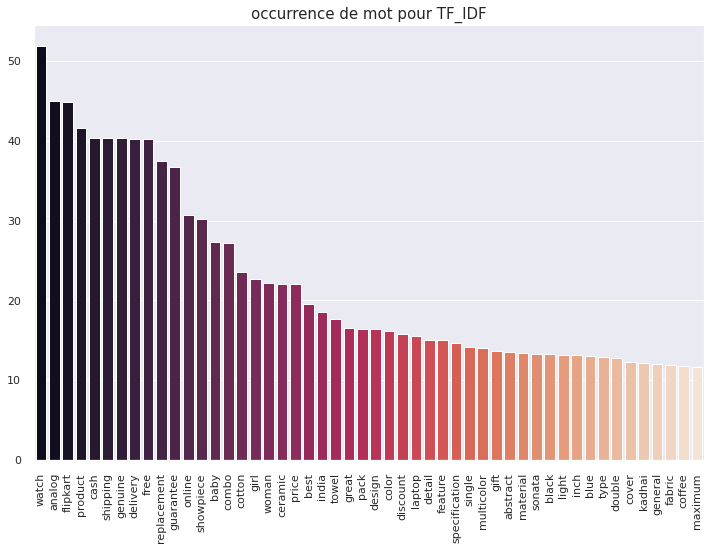

In [ ]:
plt.figure(figsize=(12, 8))
plt.title('occurrence de mot pour TF_IDF', fontsize=15)
occ_tfidf = sns.barplot(data=df_tfidf.sum().sort_values(ascending=False).to_frame().head(50).T, palette="rocket")
for item in occ_tfidf.get_xticklabels():
    item.set_rotation(90)


# Text to Vector_ Bag of words

In [ ]:
# Création du bag of words (CountVectorizer)
from sklearn.feature_extraction.text import CountVectorizer

# BOW
cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'lemmatize_text'
cv = cvect.fit_transform(df_cat[feat]).toarray()

print('BOW vector : ',cv.shape)

BOW vector :  (1050, 5296)


In [ ]:

word_count = {}

for word in test_corpus:
    
    if word not in word_count.keys():
        word_count[word] = 1
    else:
        word_count[word] += 1
        
print(f'Bag of Words: \n{test_corpus} => {word_count}')

Bag of Words: 
['elegance polyester multicolor abstract eyelet door curtain.key feature elegance polyester multicolor abstract eyelet door curtain floral curtain elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 price r 899 curtain enhances look interiors.this curtain make 100 high quality polyester fabric.it feature eyelet style stitch metal ring.it make room environment romantic loving.this curtain ant- wrinkle anti shrinkage elegant apparance.give home bright modernistic appeal design surreal attention sure steal heart contemporary eyelet valance curtain slide smoothly draw apart first thing morning welcome bright sun ray want wish good morning whole world draw close evening create special moment joyous beauty give soothing print bring home elegant curtain softly filter light room get right amount sunlight. specification elegance polyester multicolor abstract eyelet door curtain 213 cm height pack 2 general brand elegance design door type eyelet model n

In [ ]:
from wordcloud import WordCloud, STOPWORDS

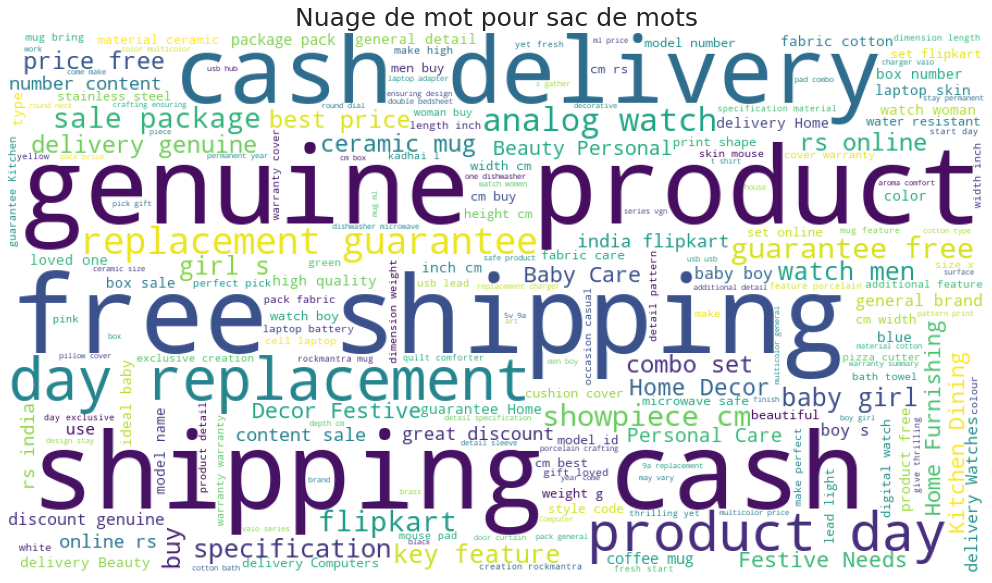

In [ ]:

stopwords = set(STOPWORDS)
corpus_text = train_df_corpus
wc = WordCloud(width = 900, height = 500, background_color = 'white', random_state = 10).generate(" ".join(corpus_text))
plt.figure( figsize=(20,10) )
plt.title('Nuage de mot pour sac de mots', fontsize=25)
plt.imshow(wc)
plt.axis('off')
plt.show()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

bow = CountVectorizer(preprocessor=preprocess_text, stop_words=stopwords, min_df=2)

bow_vector = bow.fit_transform(df_cat['product_descriptiion'])


bow_df = pd.DataFrame(bow_vector.toarray(), columns=bow.get_feature_names())
print(bow_df.shape)
bow_df

(1050, 1936)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,05tg,1000,1001,1049,1099,1100,1149,1150,1199,1290,...,yellow,york,young,youth,youthful,yuva,zero,zipper,zone,zyxel
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1046,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1047,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


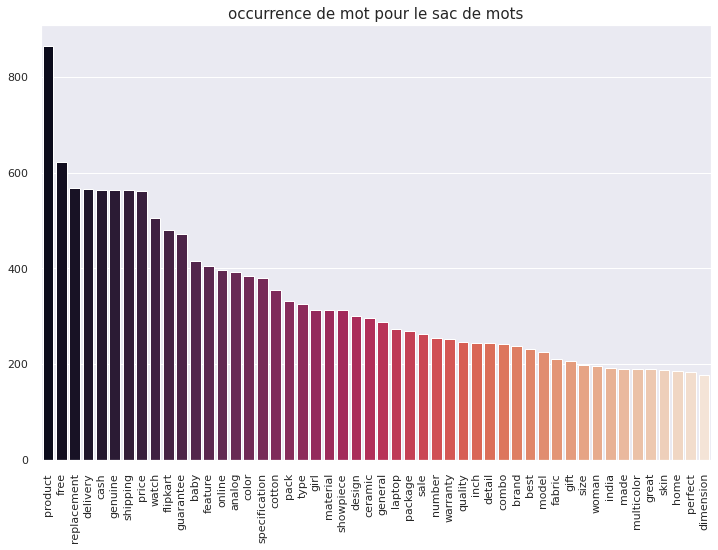

In [ ]:
plt.figure(figsize=(12, 8))
plt.title('occurrence de mot pour le sac de mots', fontsize=15)
occ_bow = sns.barplot(data=bow_df.sum().sort_values(ascending=False).to_frame().head(50).T, palette="rocket")
for item in occ_bow.get_xticklabels():
    item.set_rotation(90)

# PCA--(Bag Of Words_TF_IDF)

In [ ]:
'''# Les données
n_comp = 0.95
X = count_vect.values
features=count_vect.columns'''

'# Les données\nn_comp = 0.95\nX = count_vect.values\nfeatures=count_vect.columns'

TF_IDF

In [ ]:
# Préserver 95% de la variance
pca_tfidf = PCA(n_components=0.95)
X_tfidf_pca = pca_tfidf.fit_transform(df_tfidf)
print(X_tfidf_pca.shape)
print(pca_tfidf.explained_variance_ratio_)
print(pca_tfidf.explained_variance_ratio_.sum())
ratios_tfidf = pca_tfidf.explained_variance_ratio_

(1050, 480)
[0.04653382 0.02744887 0.02190401 0.01722551 0.01643779 0.01548013
 0.01459202 0.01341014 0.01214413 0.01028575 0.0099348  0.0097536
 0.00901284 0.00892744 0.00857937 0.00829387 0.00820846 0.00788082
 0.00767441 0.00749244 0.00722178 0.00714949 0.00700387 0.00681766
 0.00653366 0.00622274 0.00598973 0.00588666 0.0057039  0.00560497
 0.00541155 0.0052614  0.00501926 0.00497515 0.00485594 0.00476397
 0.0045807  0.00455948 0.00447492 0.00439613 0.00436381 0.00419636
 0.00415709 0.00403378 0.00397935 0.00393898 0.00390646 0.00379234
 0.00374226 0.00368193 0.00363787 0.00362701 0.0036131  0.0035508
 0.00348876 0.00344177 0.00340786 0.00336416 0.00331203 0.00328211
 0.00325143 0.00323118 0.00319437 0.00317275 0.00313257 0.00310074
 0.00306826 0.00302791 0.00301619 0.00297278 0.00294084 0.00291795
 0.0028958  0.00288926 0.00285658 0.00283606 0.0028121  0.00275567
 0.00274465 0.00271358 0.00270228 0.00265929 0.00262882 0.00260278
 0.00258071 0.00257045 0.00254996 0.00253106 0.00249

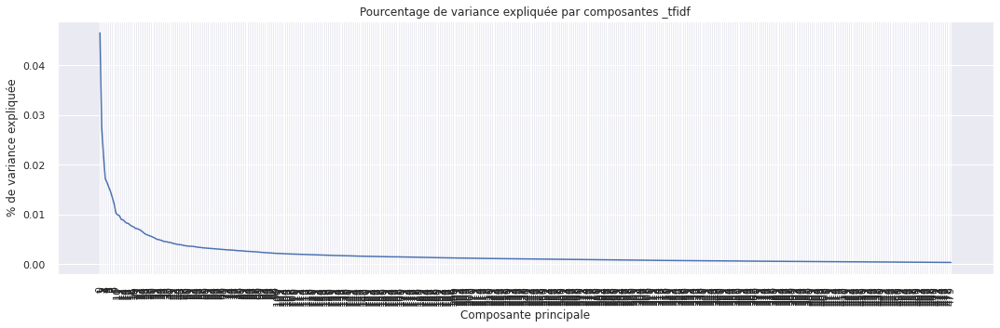

In [ ]:
plt.figure(figsize=(18, 5))
plt.plot(range(len(ratios_tfidf)), pca_tfidf.explained_variance_ratio_)
plt.xticks(range(len(ratios_tfidf)))
plt.title("Pourcentage de variance expliquée par composantes _tfidf")
plt.xticks(rotation = 90)
plt.xlabel("Composante principale")
plt.ylabel("% de variance expliquée")
plt.show()

In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_tfidf = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_tfidf.fit(X_tfidf_pca)
 # Prédiction
y_pred_tfidf_pca = kmeans_tfidf.labels_ 

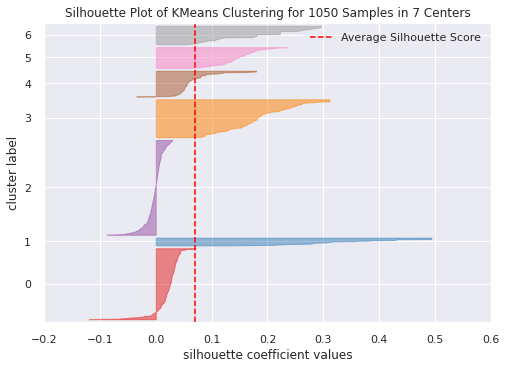

ARI_tfidf_pca = 0.26572418069832704


In [ ]:

ARI_tfidf_pca = adjusted_rand_score(df_cat['product_category'], kmeans_tfidf.labels_)
visualizer = SilhouetteVisualizer(kmeans_tfidf)
visualizer.fit(X_tfidf_pca)
visualizer.poof()  

print("ARI_tfidf_pca = "+str(ARI_tfidf_pca))



Réduction de dimension PCA+ TSNE pour TF_IDF

In [ ]:

tsne_tfidf = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_tfidf_pca_tsne = tsne_tfidf.fit_transform(X_tfidf_pca)
print(X_tfidf_pca_tsne.shape)



/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_tfidf_pca_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_tfidf_pca_tsne.fit(X_tfidf_pca_tsne)
y_pred_tfidf_pca_tsne = kmeans_tfidf_pca_tsne.labels_ 

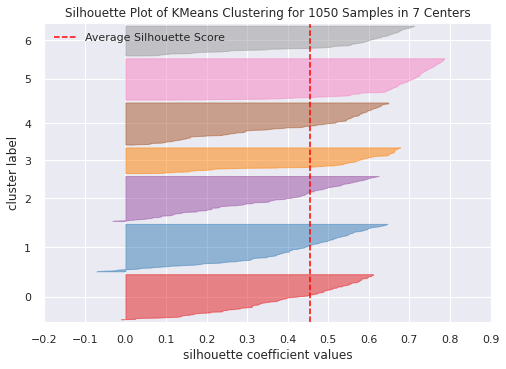

ARI_tfidf_pca_tsne = 0.538030699981047


In [ ]:
ARI_tfidf_pca_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_tfidf_pca_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_tfidf_pca_tsne)
visualizer.fit(X_tfidf_pca_tsne)
visualizer.poof()  

print("ARI_tfidf_pca_tsne = "+str(ARI_tfidf_pca_tsne))

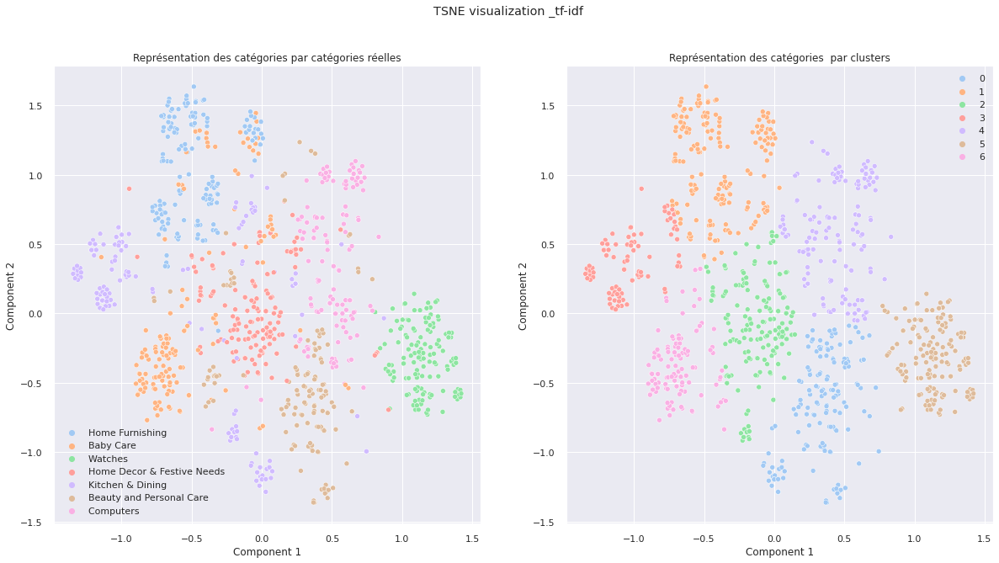

In [ ]:
y_test_tfidf = df_cat['product_category'].values
X_normalized_tfidf = RobustScaler().fit_transform(X_tfidf_pca_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _tf-idf')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_tfidf[:, 0],y=X_normalized_tfidf[:, 1], hue=y_test_tfidf, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_tfidf[:, 0], y=X_normalized_tfidf[:, 1], hue=y_pred_tfidf_pca_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

In [ ]:
def matrice_de_confusion(y_test, y_pred):
    # Create a DataFrame with labels and varieties as columns: df
    df_cluster = pd.DataFrame({'Labels': y_test, 'Clusters': y_pred})
    # Create crosstab: ct
    ct = pd.crosstab(df_cluster['Labels'], df_cluster['Clusters'])
    plt.figure(figsize = (6,4))
    sns.heatmap(ct, square=True, annot=True, fmt='d', cmap="viridis")
    plt.show()

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix

def confusion_matrix_graph(y_test, y_pred, data, corresp=None):

    labels_n = df_cat['product_category'].sort_values().unique()
    y_test = LabelEncoder().fit_transform(df_cat['product_category'])

    conf_mat = confusion_matrix(y_test.astype(str), y_pred.astype(str))

    if corresp is None:
        corresp = np.argmax(conf_mat, axis=0)
        print ("Correspondance des clusters : ", corresp)
    else:
        corresp = corresp
    
    labels = pd.Series(y_test, name="y_test").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    cls_labels_transform = labels['y_pred_transform']

    conf_mat = confusion_matrix(y_test.astype(str), cls_labels_transform.astype(str))

    df_conf_mat = pd.DataFrame(conf_mat, index = [label for label in labels_n],columns = [i for i in labels_n]) 

    plt.figure(figsize = (10,5))
    sns.heatmap(df_conf_mat , annot=True, cmap="viridis", fmt='2d', linecolor='white', linewidths=1,)
    plt.xlabel('Libellé prédit')
    plt.ylabel('Réalle étiquette')
    plt.show()

Correspondance des clusters :  [1 4 3 5 2 6 0]


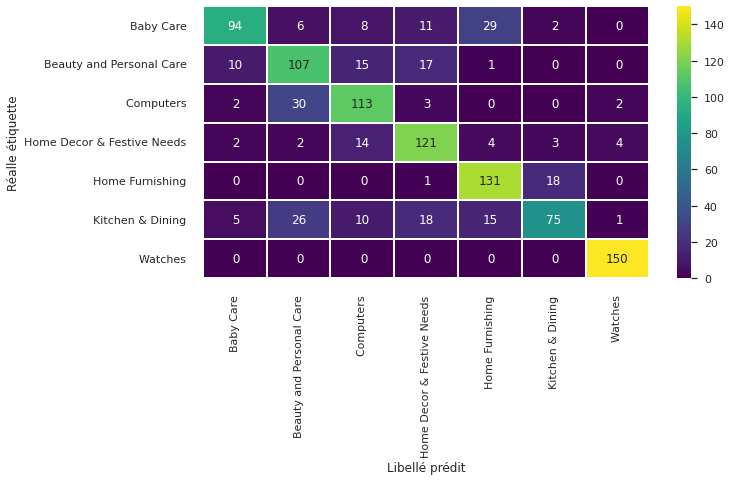

In [ ]:
confusion_matrix_graph(y_test_tfidf, y_pred_tfidf_pca_tsne, data=df_cat)

Bag Of Words

In [ ]:
# Préserver 95% de la variance
pca_bow = PCA(n_components=0.95)
X_bow_pca = pca_bow.fit_transform(bow_df)
print(X_bow_pca.shape)
print(pca_bow.explained_variance_ratio_)
print(pca_bow.explained_variance_ratio_.sum())
ratios_bow = pca_bow.explained_variance_ratio_

(1050, 302)
[0.06234262 0.05393875 0.0360855  0.03247028 0.02642064 0.02422234
 0.02151113 0.02030996 0.01955036 0.01660275 0.01558461 0.01446494
 0.01407176 0.01332803 0.0129003  0.01198973 0.01111792 0.01038669
 0.01027195 0.00996179 0.00937139 0.00909832 0.00851752 0.00846661
 0.008182   0.00788615 0.00778215 0.00731404 0.00729394 0.0071622
 0.00687936 0.00674194 0.00666443 0.00638607 0.00626263 0.00596977
 0.00596807 0.00582468 0.00577756 0.00552876 0.00542818 0.005161
 0.00502777 0.00495556 0.00487912 0.00481668 0.0047005  0.00458633
 0.00454796 0.00437433 0.00430722 0.00409218 0.00397796 0.00389779
 0.00387361 0.00382127 0.00372196 0.0036909  0.0036275  0.00350999
 0.00347863 0.00342372 0.00335401 0.00328778 0.00324552 0.00317342
 0.00313709 0.00311048 0.00305385 0.00300703 0.00294289 0.00291727
 0.00285771 0.00284225 0.00279342 0.00275489 0.00275219 0.00267271
 0.00262162 0.00258394 0.00255176 0.00252808 0.0025151  0.00248162
 0.00245072 0.00244383 0.0023772  0.00234409 0.002313

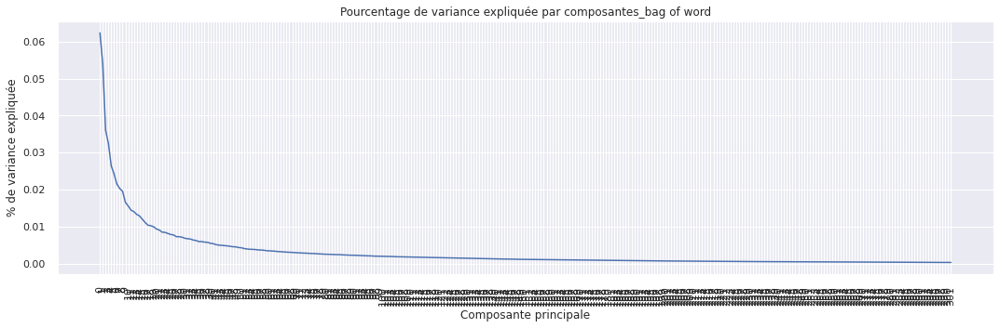

In [ ]:

plt.figure(figsize=(18, 5))
plt.plot(range(len(ratios_bow)), pca_bow.explained_variance_ratio_)
plt.xticks(range(len(ratios_bow)))
plt.title("Pourcentage de variance expliquée par composantes_bag of word")
plt.xticks(rotation = 90)
plt.xlabel("Composante principale")
plt.ylabel("% de variance expliquée")
plt.show()

In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_bow = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_bow.fit(X_bow_pca)
 # Prédiction
y_pred_bow_pca = kmeans_bow.labels_ 

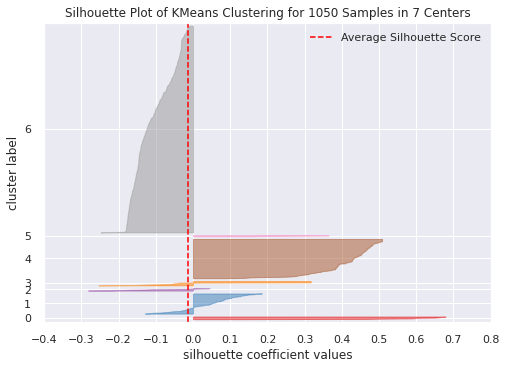

ARI_bow_pca = 0.1394750538842658


In [ ]:
ARI_bow_pca = adjusted_rand_score(df_cat['product_category'], kmeans_bow.labels_)
visualizer = SilhouetteVisualizer(kmeans_bow)
visualizer.fit(X_bow_pca)
visualizer.poof()  

print("ARI_bow_pca = "+str(ARI_bow_pca))


Réduction de dimension PCA+ TSNE pour Bag of word

In [ ]:
tsne_bow = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_bow_pca_tsne = tsne_bow.fit_transform(X_bow_pca)
print(X_bow_pca_tsne.shape)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_bow_pca_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_bow_pca_tsne.fit(X_bow_pca_tsne)
y_pred_bow_pca_tsne = kmeans_bow_pca_tsne.labels_ 

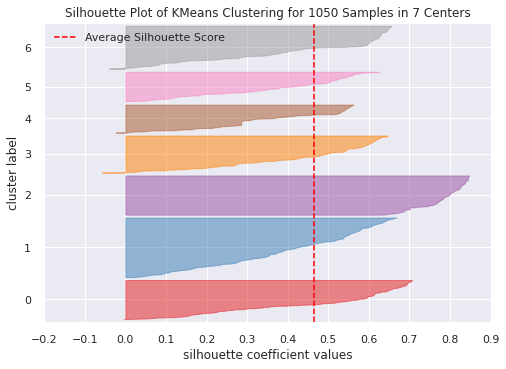

ARI_bow_pca_tsne = 0.38893726310068794


In [ ]:
ARI_bow_pca_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_bow_pca_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_bow_pca_tsne)
visualizer.fit(X_bow_pca_tsne)
visualizer.poof()  

print("ARI_bow_pca_tsne = "+str(ARI_bow_pca_tsne))

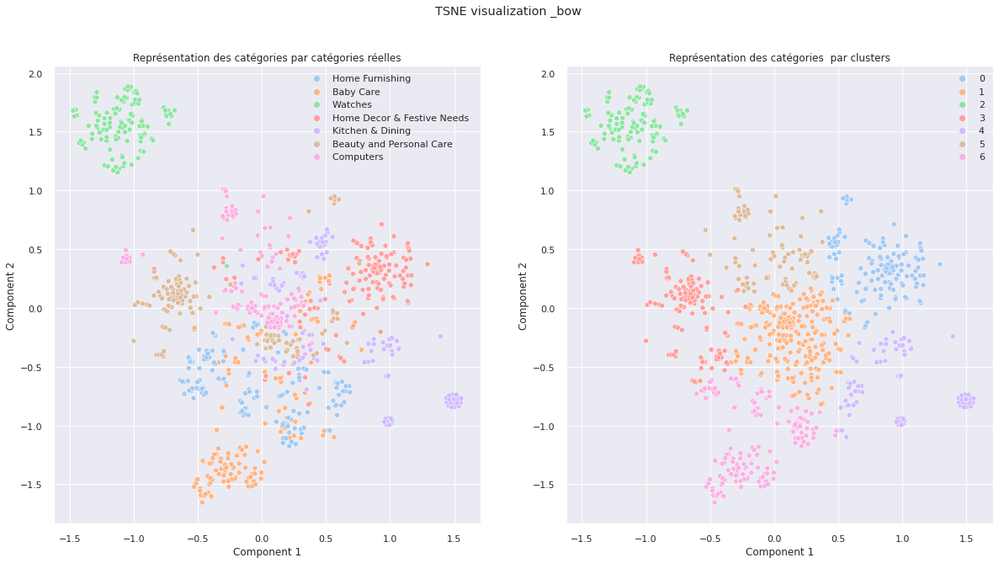

In [ ]:
y_test_bow = df_cat['product_category'].values
X_normalized_bow = RobustScaler().fit_transform(X_bow_pca_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _bow')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_bow[:, 0],y=X_normalized_bow[:, 1], hue=y_test_bow, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_bow[:, 0], y=X_normalized_bow[:, 1], hue=y_pred_bow_pca_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [3 2 6 1 5 2 0]


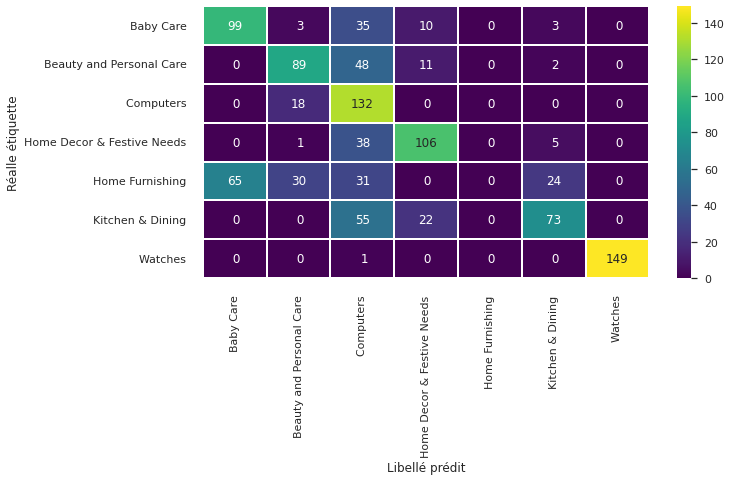

In [ ]:
confusion_matrix_graph(y_test_bow, y_pred_bow_pca_tsne, data=df_cat)

## Word2Vec

In [ ]:
# create bag of words (Tf-idf) for 'lemmatize_text' feature 
from sklearn.feature_extraction.text import TfidfVectorizer

ctf = TfidfVectorizer(stop_words='english', min_df=1)

feat = 'lemmatize_text'
ctf_fit = ctf.fit(df_cat[feat])
ctf_transform = ctf.transform(df_cat[feat])

len(ctf.idf_)


5296

### Create Word2Vec model¶


In [ ]:

df_cat['length_bow_lem'] = df_cat['lemmatize_text'].apply(lambda x : len(word_tokenize(x)))
print("max length bow lem : ", df_cat['length_bow_lem'].max())

max length bow lem :  391


In [ ]:
w2v_size = 500
w2v_window = 5
w2v_min_count = 5
w2v_epochs = 100
maxlen = 391 # adapt to length of sentences
descriptions = df_cat['lemmatize_text'].to_list()
descriptions = [gensim.utils.simple_preprocess(text) for text in descriptions]

# Création et entraînement du modèle Word2Vec
print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count = w2v_min_count, 
                                   window = w2v_window,
                                   vector_size = w2v_size,
                                   seed = 42,
                                   workers = 1)
                                    # workers=multiprocessing.cpu_count())
w2v_model.build_vocab(descriptions)
w2v_model.train(descriptions, total_examples = w2v_model.corpus_count, epochs = w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")




Build & train Word2Vec model ...
Vocabulary size: 1679
Word2Vec trained


In [ ]:
w2v_model.wv.most_similar(positive='baby', topn=20)

[('cotton', 0.47041305899620056),
 ('sleepsuit', 0.39484792947769165),
 ('striped', 0.36649438738822937),
 ('shaun', 0.3640989065170288),
 ('romper', 0.3602585792541504),
 ('embroider', 0.3592248558998108),
 ('dress', 0.35530567169189453),
 ('home', 0.34807538986206055),
 ('portia', 0.3354432284832001),
 ('babeezworld', 0.3334539532661438),
 ('top', 0.33342885971069336),
 ('grey', 0.332049161195755),
 ('fabric', 0.32896846532821655),
 ('waist', 0.32740268111228943),
 ('girl', 0.3273746371269226),
 ('track', 0.3263268768787384),
 ('frock', 0.3262103796005249),
 ('wash', 0.3254759609699249),
 ('personal', 0.3152731657028198),
 ('computers', 0.31217095255851746)]

In [ ]:
w2v_model.wv.similarity(w1 = 'baby', w2 = 'girl')

0.32737464

In [ ]:
len(w2v_words)

1679

In [ ]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(descriptions)
x_descriptions = pad_sequences(tokenizer.texts_to_sequences(descriptions),
                               maxlen = maxlen,
                               padding = 'post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)
x_descriptions

Fit Tokenizer ...
Number of unique words: 4569


array([[ 734,  126,   64, ...,    0,    0,    0],
       [1685,   26,  152, ...,    0,    0,    0],
       [1144,   26,  766, ...,    0,    0,    0],
       ...,
       [1477,  698,  366, ...,    0,    0,    0],
       [ 465,  327,  267, ...,    0,    0,    0],
       [1477,  366,  267, ...,    0,    0,    0]], dtype=int32)

## Création de la matrice d'embedding

In [ ]:
# Création de la matrice d'embedding
print("Create Embedding matrix ...")
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  0.3676
Embedding matrix: (4569, 500)


In [ ]:
embedding_matrix


array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.14832665, -0.67580473, -0.8752327 , ...,  0.0827048 ,
         1.62433255, -0.62914389],
       [ 0.41310686, -0.68746001,  1.11564112, ..., -0.89936095,
         0.61900675, -0.67949378],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

## Création du modèle d'embedding

In [ ]:
# Création du modèle

input=Input(shape=(len(x_descriptions),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 391)]             0         
                                                                 
 embedding (Embedding)       (None, 391, 500)          2284500   
                                                                 
 global_average_pooling1d (G  (None, 500)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 2,284,500
Trainable params: 2,284,500
Non-trainable params: 0
_________________________________________________________________


## Exécution du modèle

In [ ]:
x_descriptions

array([[ 734,  126,   64, ...,    0,    0,    0],
       [1685,   26,  152, ...,    0,    0,    0],
       [1144,   26,  766, ...,    0,    0,    0],
       ...,
       [1477,  698,  366, ...,    0,    0,    0],
       [ 465,  327,  267, ...,    0,    0,    0],
       [1477,  366,  267, ...,    0,    0,    0]], dtype=int32)

In [ ]:
len(x_descriptions)

1050

In [ ]:
embeddings = embed_model.predict(x_descriptions)
embeddings.shape

33/33 [==============================] - 1s 13ms/step


(1050, 500)

In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_word2vec = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_word2vec.fit(embeddings)
y_pred_word2vec = kmeans_word2vec.labels_ 

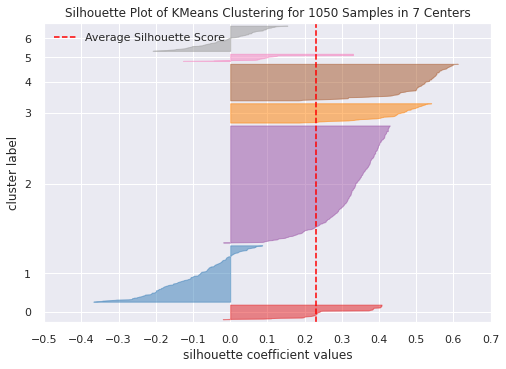

ARI_word2vec = 0.19045906403018115


In [ ]:
ARI_word2vec = adjusted_rand_score(df_cat['product_category'], kmeans_word2vec.labels_)
visualizer = SilhouetteVisualizer(kmeans_word2vec)
visualizer.fit(embeddings)
visualizer.poof()  

print("ARI_word2vec = "+str(ARI_word2vec))

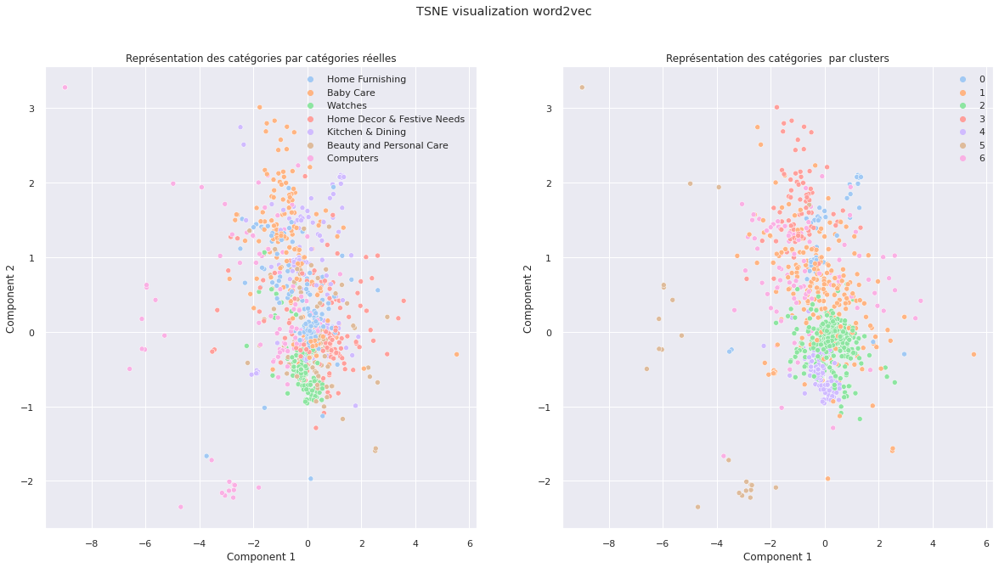

In [ ]:
y_test_word2vec = df_cat['product_category'].values
X_normalized_word2vec = RobustScaler().fit_transform(embeddings)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization word2vec')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_word2vec[:, 0],y=X_normalized_word2vec[:, 1], hue=y_test_word2vec, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_word2vec[:, 0], y=X_normalized_word2vec[:, 1], hue=y_pred_word2vec, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [5 5 1 0 6 2 4]


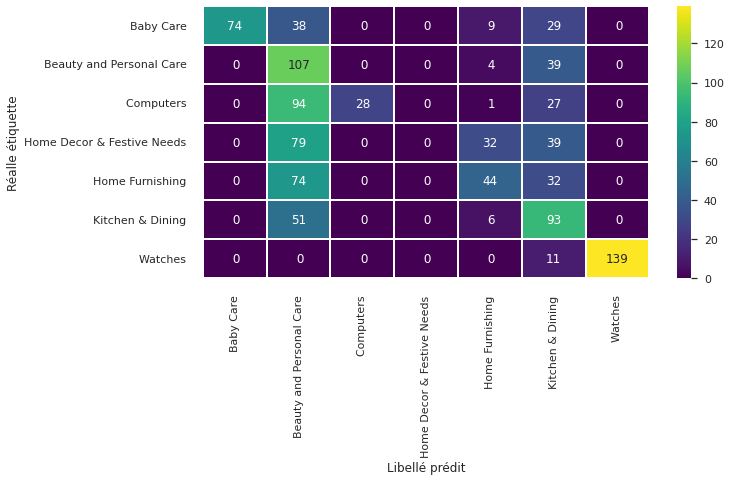

In [ ]:
#Matrice de confusion avec les noms de catégories
confusion_matrix_graph(y_test_word2vec, y_pred_word2vec, data=df_cat)

TSNE+Word2vec

In [ ]:
tsne_word2vec = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_word2vec_tsne = tsne_bow.fit_transform(embeddings)
print(X_word2vec_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_word2vec_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_word2vec_tsne.fit(X_word2vec_tsne)
y_pred_word2vec_tsne = kmeans_word2vec_tsne.labels_ 

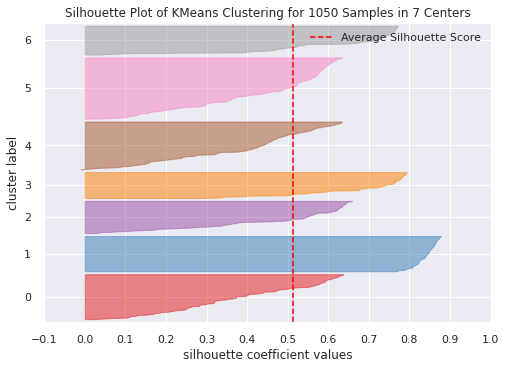

ARI_word2vec_tsne = 0.4247336157332022


In [ ]:
ARI_word2vec_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_word2vec_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_word2vec_tsne)
visualizer.fit(X_word2vec_tsne)
visualizer.poof()  

print("ARI_word2vec_tsne = "+str(ARI_word2vec_tsne))

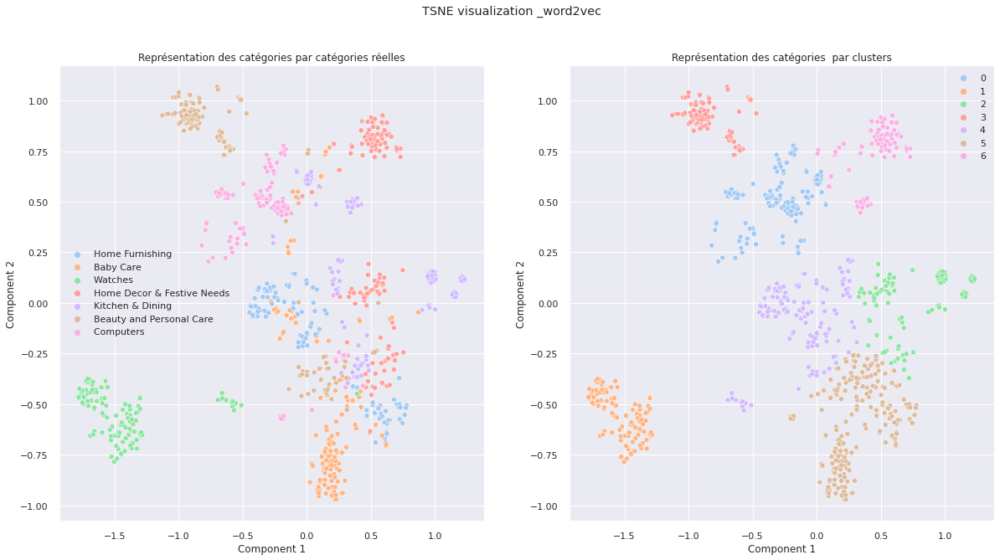

In [ ]:
y_test_word2vec = df_cat['product_category'].values
X_normalized_word2vec = RobustScaler().fit_transform(X_word2vec_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _word2vec')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_word2vec[:, 0],y=X_normalized_word2vec[:, 1], hue=y_test_word2vec, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_word2vec[:, 0], y=X_normalized_word2vec[:, 1], hue=y_pred_word2vec_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [2 6 5 1 4 0 3]


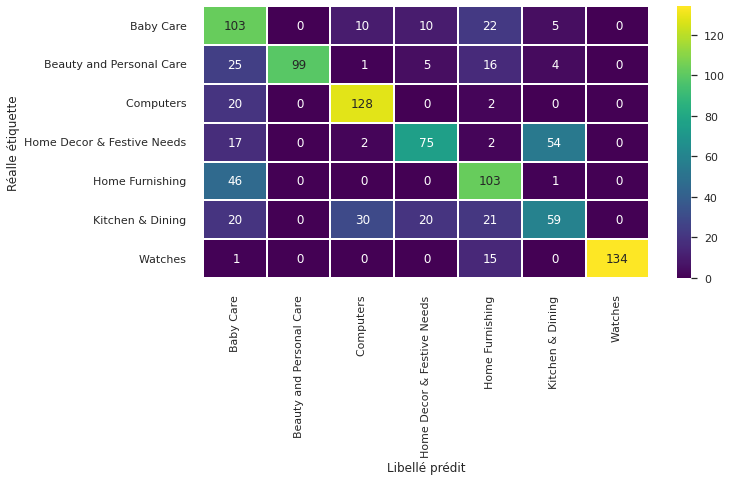

In [ ]:
confusion_matrix_graph(y_test_word2vec, y_pred_word2vec_tsne, data=df_cat)

# BERT

In [ ]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import tensorflow as tf
# import tensorflow_hub as hub
import tensorflow.keras
from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model

# Bert
import os
import transformers
from transformers import *

os.environ["TF_KERAS"]='1'

In [ ]:
print(tf.__version__)
print(tensorflow.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print(tf.test.is_built_with_cuda())

2.9.2
2.9.2
Num GPUs Available:  0
True


In [ ]:
def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ')
    sentence_clean = sentence.replace('#', ' ').replace('.', ' . ').replace(',', ' , ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# lower case and alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@"))
                                       and (not w.startswith("http"))]
    return lw

# Fonction de préparation du texte pour le Deep learning (USE et BERT)
def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

In [ ]:
df_cat['description_dl'] = df_cat['product_descriptiion'].apply(lambda x : transform_dl_fct(x))

In [ ]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot


## BERT HuggingFace


In [ ]:
df_cat['length_dl'] = df_cat['description_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", df_cat['length_dl'].max())

max length dl :  652


### bert-base-uncased

In [ ]:
max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = df_cat['description_dl'].to_list()

In [ ]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         max_length, batch_size, mode='HF')

In [ ]:
features_bert

array([[ 0.05292336, -0.12222084,  0.7544624 , ..., -0.24604757,
        -0.07552375, -0.21316223],
       [ 0.31449184, -0.11911573,  0.54965943, ..., -0.22356957,
        -0.27278125,  0.0193216 ],
       [ 0.15749617, -0.11888751,  0.7002542 , ..., -0.20110351,
        -0.25517038, -0.12424216],
       ...,
       [ 0.29270437, -0.04439645,  0.5323427 , ..., -0.03863905,
         0.08361925, -0.1122376 ],
       [ 0.1811952 , -0.04653598,  0.5205909 , ...,  0.10820152,
         0.07451835, -0.28351137],
       [ 0.2135664 , -0.16846654,  0.6849237 , ...,  0.06509835,
         0.09563742, -0.18754038]], dtype=float32)

### TSNE+Bret-base-uncased

In [ ]:
tsne_bret_base = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_bret_base_tsne = tsne_bret_base.fit_transform(features_bert)
print(X_bret_base_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_bret_base_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_bret_base_tsne.fit(X_bret_base_tsne)
y_pred_bret_base_tsne = kmeans_bret_base_tsne.labels_ 

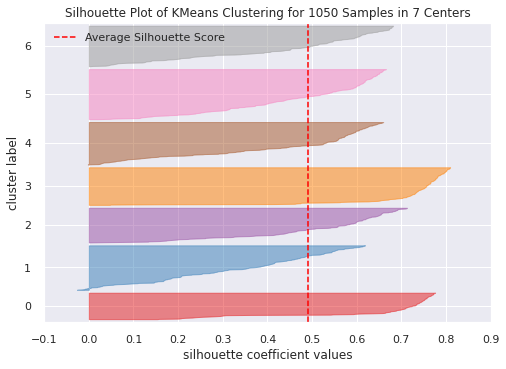

ARI_bret_base_tsne = 0.3672071027784623


In [ ]:
ARI_bret_base_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_bret_base_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_bret_base_tsne)
visualizer.fit(X_bret_base_tsne)
visualizer.poof()  

print("ARI_bret_base_tsne = "+str(ARI_bret_base_tsne))

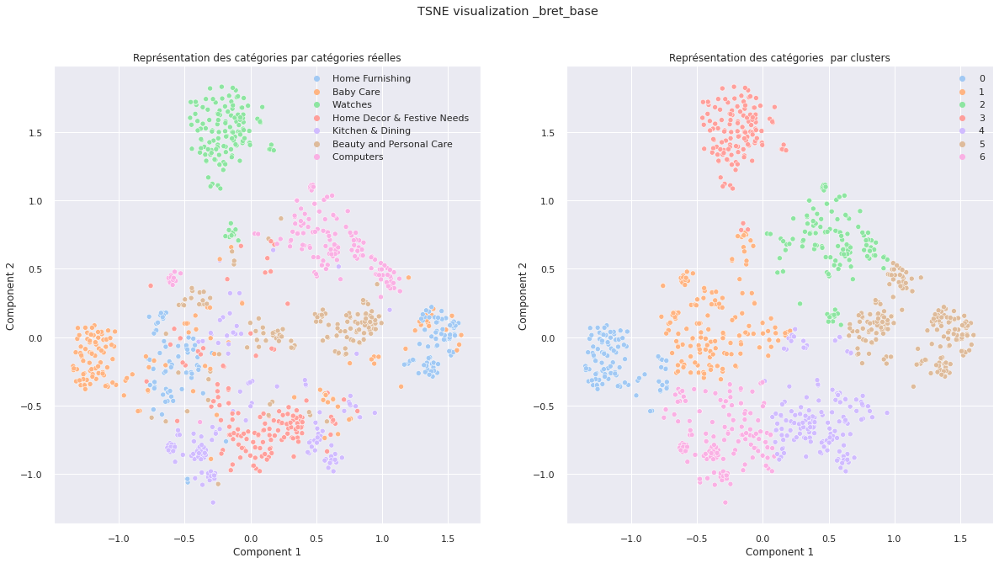

In [ ]:
y_test_bret_base = df_cat['product_category'].values
X_normalized_bret_base = RobustScaler().fit_transform(X_bret_base_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _bret_base')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_bret_base[:, 0],y=X_normalized_bret_base[:, 1], hue=y_test_bret_base, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_bret_base[:, 0], y=X_normalized_bret_base[:, 1], hue=y_pred_bret_base_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [0 4 2 6 3 4 5]


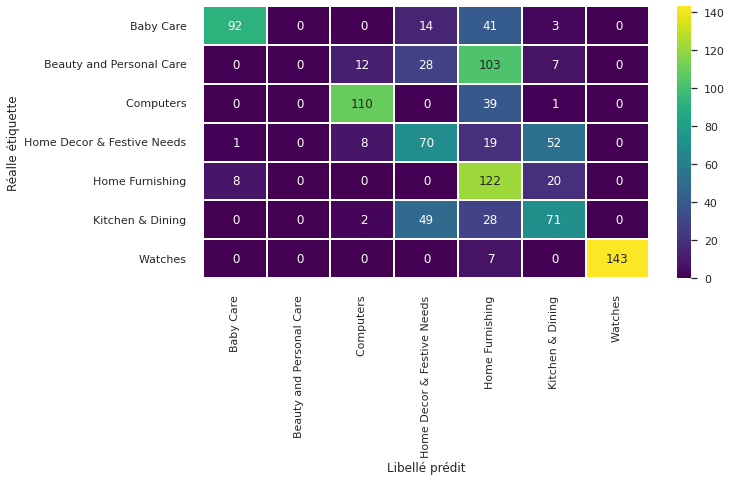

In [ ]:
confusion_matrix_graph(y_test_bret_base, y_pred_bret_base_tsne, data=df_cat)

## bert-large-uncased¶


In [ ]:
max_length = 64
batch_size = 10
model_type = 'bert-large-uncased'
model = TFAutoModel.from_pretrained(model_type)
descriptions = df_cat['description_dl'].to_list()


In [ ]:
# Création des features
features_bert_large, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions, max_length, batch_size, mode='HF')

### TSNE+Bret-large-uncased

In [ ]:
tsne_bret_large = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_bret_large_tsne = tsne_bret_large.fit_transform(features_bert_large)
print(X_bret_large_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_bret_large_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_bret_large_tsne.fit(X_bret_large_tsne)
y_pred_bret_large_tsne = kmeans_bret_large_tsne.labels_ 

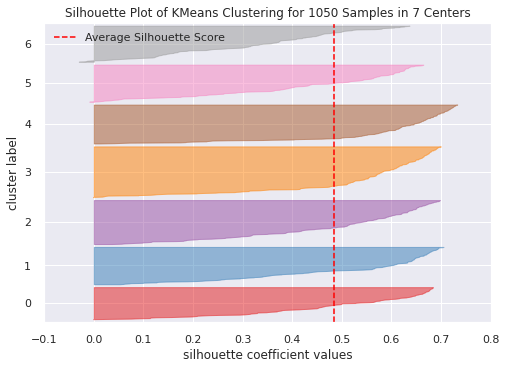

ARI_bret_large_tsne = 0.3565586281863283


In [ ]:
ARI_bret_large_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_bret_large_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_bret_large_tsne)
visualizer.fit(X_bret_large_tsne)
visualizer.poof()  

print("ARI_bret_large_tsne = "+str(ARI_bret_large_tsne))

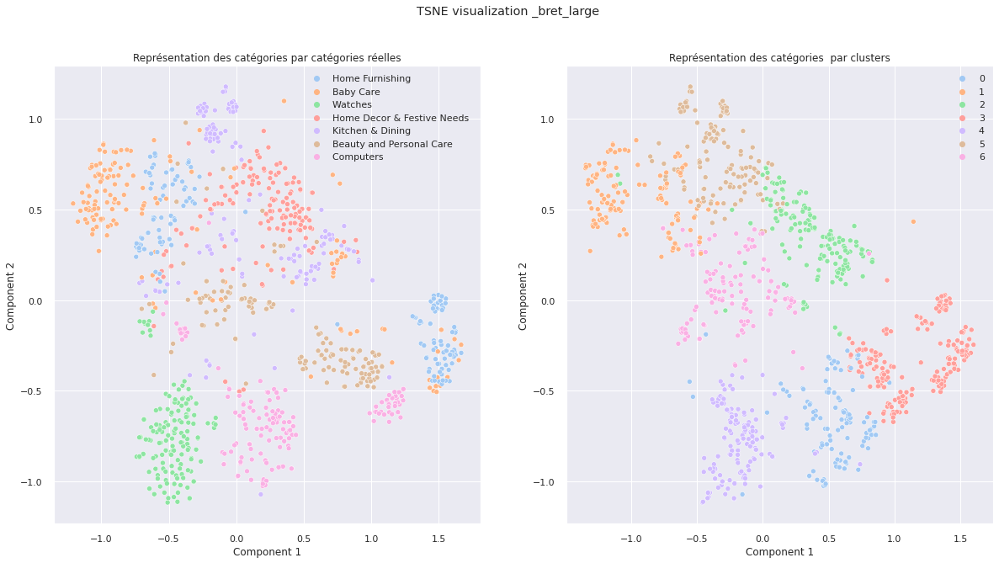

In [ ]:
y_test_bret_large = df_cat['product_category'].values
X_normalized_bret_large = RobustScaler().fit_transform(X_bret_large_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _bret_large')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_bret_large[:, 0],y=X_normalized_bret_large[:, 1], hue=y_test_bret_large, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_bret_base[:, 0], y=X_normalized_bret_large[:, 1], hue=y_pred_bret_large_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [2 0 3 4 6 5 1]


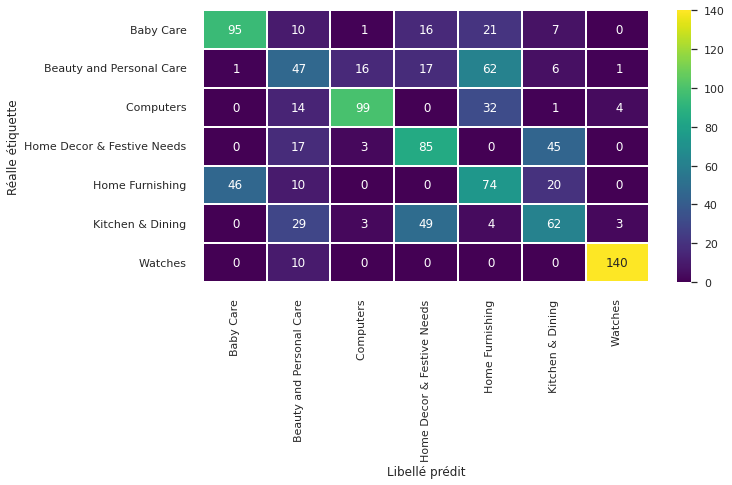

In [ ]:
confusion_matrix_graph(y_test_bret_large, y_pred_bret_large_tsne, data=df_cat)

## BERT hub Tensorflow

In [ ]:
import tensorflow_hub as hub
import tensorflow_text 

# Guide sur le Tensorflow hub : https://www.tensorflow.org/text/tutorials/classify_text_with_bert
model_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4'
bert_layer = hub.KerasLayer(model_url, trainable=True)

In [ ]:
descriptions_bert_hub = df_cat['description_dl'].to_list()

In [ ]:

max_length = 64
batch_size = 10
model_type = 'bert-base-uncased'
model = bert_layer

features_bert_hub, last_hidden_states_tot = feature_BERT_fct(model, model_type, descriptions_bert_hub, 
                                                         max_length, batch_size, mode='TFhub')

temps traitement :  245.0


### TSNE+Bret-Hub

In [ ]:
tsne_bret_hub = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_bret_hub_tsne = tsne_bret_hub.fit_transform(features_bert_hub)
print(X_bret_hub_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_bret_hub_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_bret_hub_tsne.fit(X_bret_hub_tsne)
y_pred_bret_hub_tsne = kmeans_bret_hub_tsne.labels_ 

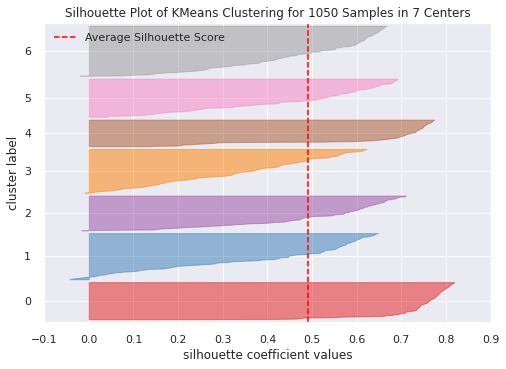

ARI_bret_hub_tsne = 0.3611075085503007


In [ ]:
ARI_bret_hub_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_bret_hub_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_bret_hub_tsne)
visualizer.fit(X_bret_hub_tsne)
visualizer.poof()  

print("ARI_bret_hub_tsne = "+str(ARI_bret_hub_tsne))

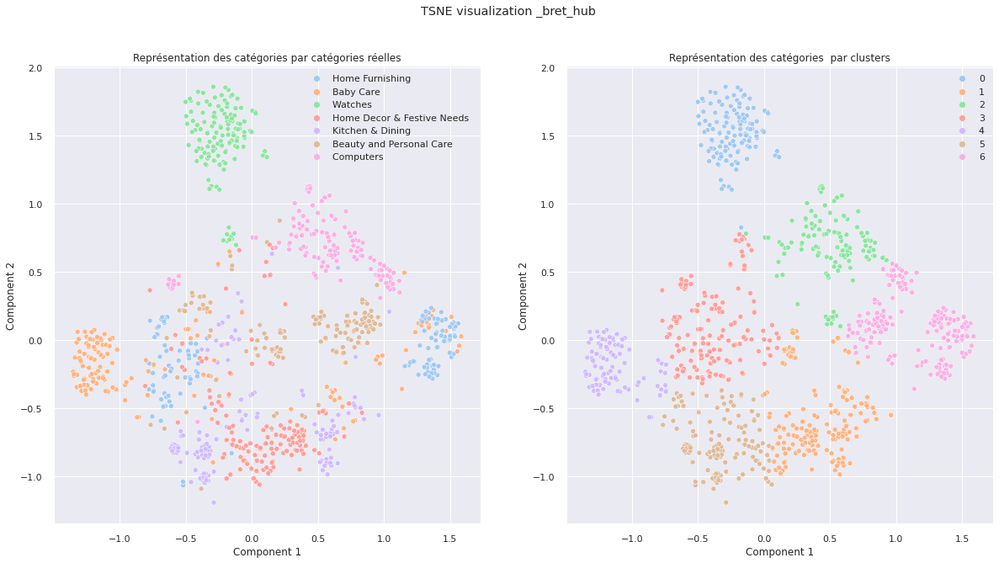

In [ ]:
y_test_bret_hub = df_cat['product_category'].values
X_normalized_bret_hub = RobustScaler().fit_transform(X_bret_hub_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _bret_hub')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_bret_hub[:, 0],y=X_normalized_bret_hub[:, 1], hue=y_test_bret_hub, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_bret_hub[:, 0], y=X_normalized_bret_hub[:, 1], hue=y_pred_bret_hub_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [6 3 2 4 0 5 4]


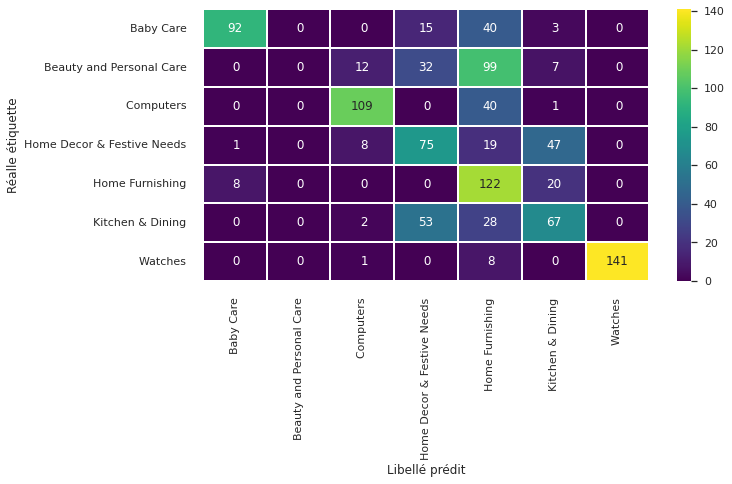

In [ ]:
confusion_matrix_graph(y_test_bret_hub, y_pred_bret_hub_tsne, data=df_cat)

# USE - Universal Sentence Encoder

In [ ]:
import tensorflow_hub as hub

embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

In [ ]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features



In [ ]:
descriptions_USE = df_cat['description_dl'].to_list()
features_USE = feature_USE_fct(descriptions_USE, b_size = 10)

### TSNE+USE

In [ ]:
tsne_use = TSNE(n_components=2, init='pca', perplexity=42, random_state=42)
X_use_tsne = tsne_use.fit_transform(features_USE)
print(X_use_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


(1050, 2)


In [ ]:
n_clusters = df_cat['product_category'].nunique()
kmeans_use_tsne = KMeans(n_clusters=n_clusters, init='k-means++')
kmeans_use_tsne.fit(X_use_tsne)
y_pred_use_tsne = kmeans_use_tsne.labels_ 

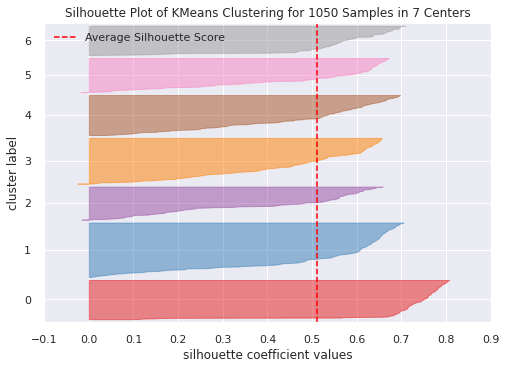

ARI_use_tsne = 0.4799329104142017


In [ ]:
ARI_use_tsne = adjusted_rand_score(df_cat['product_category'], kmeans_use_tsne.labels_)
visualizer = SilhouetteVisualizer(kmeans_use_tsne)
visualizer.fit(X_use_tsne)
visualizer.poof()  

print("ARI_use_tsne = "+str(ARI_use_tsne))

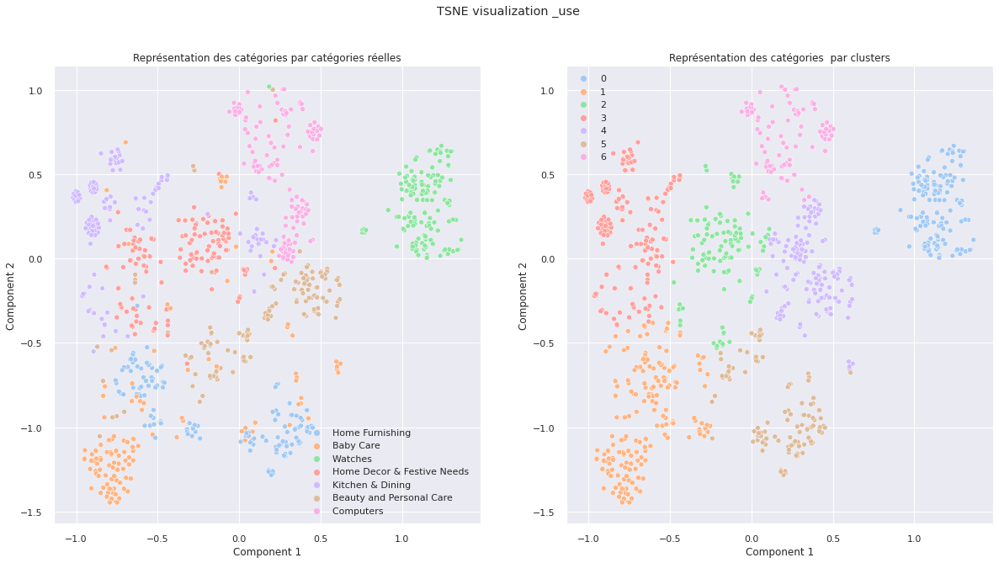

In [ ]:
y_test_use = df_cat['product_category'].values
X_normalized_use = RobustScaler().fit_transform(X_use_tsne)

fig = plt.figure(1, figsize=(20, 10))
fig.suptitle('TSNE visualization _use')

plt.subplot(1, 2, 1)
sns.scatterplot(x=X_normalized_use[:, 0],y=X_normalized_use[:, 1], hue=y_test_use, palette='pastel')
plt.title('Représentation des catégories par catégories réelles')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.subplot(1, 2, 2)
sns.scatterplot(x=X_normalized_use[:, 0], y=X_normalized_use[:, 1], hue=y_pred_use_tsne, palette='pastel')
plt.title('Représentation des catégories  par clusters')
plt.xlabel('Component 1')
plt.ylabel('Component 2')

plt.show()

Correspondance des clusters :  [6 0 3 5 1 4 2]


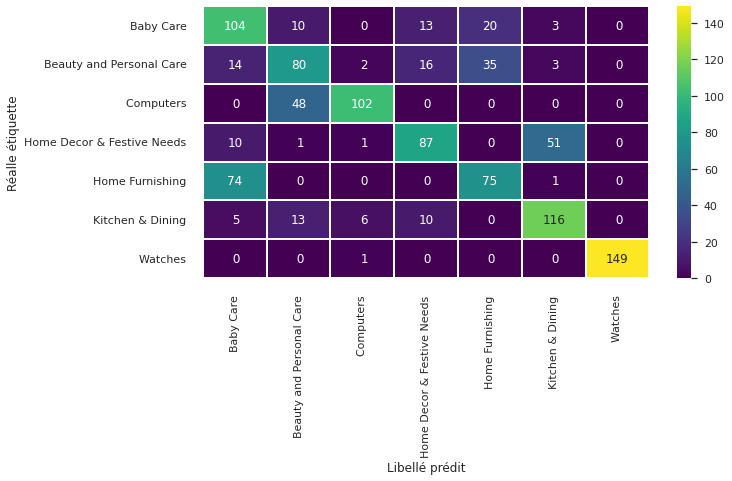

In [ ]:
confusion_matrix_graph(y_test_use, y_pred_use_tsne, data=df_cat)

# Comparaison des résultats

In [ ]:
model_ari_eval = pd.DataFrame({'model_name':["TF-IDF","Bag of word","Word2Vec","Bret Base","Bret large","Bret hub", "USE"],
                    'adjusted_rand_score':[ARI_tfidf_pca_tsne, ARI_bow_pca_tsne,  ARI_word2vec_tsne, ARI_bret_base_tsne,ARI_bret_large_tsne, ARI_bret_hub_tsne, ARI_use_tsne]})
model_ari_eval

,model_name,adjusted_rand_score
0,TF-IDF,0.538031
1,Bag of word,0.388937
2,Word2Vec,0.424734
3,Bret Base,0.367207
4,Bret large,0.356559
5,Bret hub,0.361108
6,USE,0.479933


Incorporation de phrases à l'aide de BERT the Universal Sentence Encoder (USE)
Les modèles BERT (Bidirectional Encoder Representations from Transformers) et USE ont été testés en fournissant des descriptions non lemmatisées aux modèles pré-entraînés.

Bien qu'il s'agisse de modèles d'apprentissage en profondeur et qu'il faille du temps pour traiter les mots intégrés, les résultats étaient moins impressionnants que les modèles de texte plus simples.

Cela peut être dû au fait que les descriptions de produits ne sont généralement pas des phrases, mais sont souvent générées à partir de paires clé-valeur de caractéristiques de produit. En utilisant les skipgrams, les clés telles que {couleur, longueur, largeur, hauteur, quantité,...) peuvent ajouter du bruit plutôt que du contexte. En revanche, ces mots ont peu de poids dans la vectorisation TF-IDF.


Text(0, 0.5, 'Adjusted rand score')

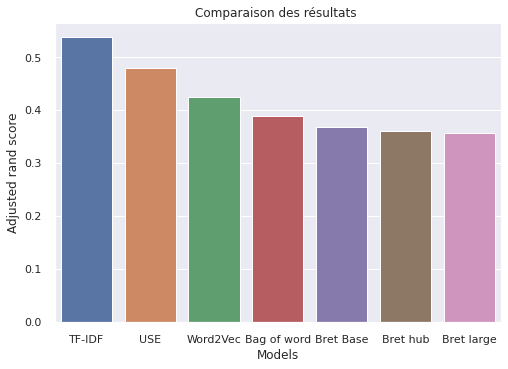

In [ ]:
sort_ARI = model_ari_eval.sort_values('adjusted_rand_score', ascending=False).head(7)
plt.title('Comparaison des résultats ')
sns.barplot(x=sort_ARI['model_name'], y=sort_ARI['adjusted_rand_score'])
plt.xlabel('Models')
plt.ylabel('Adjusted rand score')

# Données images

In [ ]:
from tensorflow import keras
from tensorflow.keras.models import Model

from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import resnet50

from tensorflow.keras.applications.resnet50 import ResNet50 
from keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception

from keras.applications.vgg16 import preprocess_input as ppss_vgg
from keras.applications.xception import preprocess_input as ppss_xce
from tensorflow.keras.applications.resnet50 import preprocess_input as ppss_resnet
from keras.applications.inception_v3 import preprocess_input as ppss_incep
from keras.applications.resnet_v2 import preprocess_input as ppss_restv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
! ls '/content/drive/MyDrive/DS_P6/Flipkart/'

flipkart_com-ecommerce_sample_1050.csv	Images


In [ ]:
# Les données
data_nlp = pd.read_csv("/content/drive/MyDrive/DS_P6/Flipkart/flipkart_com-ecommerce_sample_1050.csv",sep=',')


In [ ]:
#create category
data_nlp['category']=data_nlp['product_category_tree'].str.split(
    pat=">>",expand=True)[0]
data_nlp["category"] = data_nlp["category"].str.replace('[', "")
data_nlp["category"] = data_nlp["category"].str.replace('"', "")
data_nlp["category"] = data_nlp["category"].str.replace(' ', "")

catg  = {'HomeFurnishing':'Home',
         'Watches':'Watches',
         'HomeDecor&FestiveNeeds':'Decor',
         'BabyCare':'Baby',
         'BeautyandPersonalCare':'Beauty',
         'Computers':'Computers',
         'Kitchen&Dining':'Kitchen'}
data_nlp['category'] =[catg[i] for i in data_nlp['category']]
cluster  = {'Home':0,
           'Watches':1,
           'Decor':2,
           'Baby':3,
           'Beauty':4,
           'Computers':5,
           'Kitchen':6}

y_true = data_nlp['category'].map(cluster)
list_labels=data_nlp["category"].unique()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  after removing the cwd from sys.path.


In [ ]:
from os import listdir
from os.path import join, isfile

path = "/content/drive/MyDrive/DS_P6/Flipkart/Images/"
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


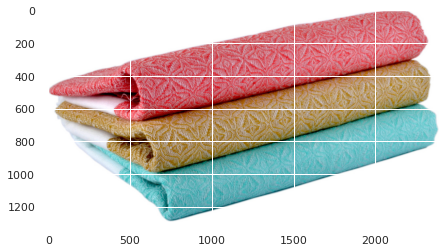

In [ ]:
from PIL import Image
path = "/content/drive/MyDrive/DS_P6/Flipkart/Images/"

im = Image.open(path+data_nlp.image[1])

plt.figure(figsize=(7,7))
plt.imshow(im)

In [ ]:
# Echantillon de données
df_img =  data_nlp.copy()
df_img.head(3)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,category
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby


In [ ]:
# Création d'une nouvelle dataframe
df_path = pd.DataFrame()
df_path["image_path"] = list_photos

# Sélectionner les deux colonnes qui m'intéressent
df_img = df_img[['image','category']]
df_img.head(5)

,image,category
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home


In [ ]:
 # transformer des étiquettes en étiquettes numériques
from sklearn import preprocessing
# Instanciation du transformeur
encoder = preprocessing.LabelEncoder()
# Installez l'encodeur d'étiquettes et renvoyez les étiquettes codées
df_img["label"] = encoder.fit_transform(df_img["category"])
# Afficher les 5 premières lignes
df_img.head(5)  

,image,category,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Home,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Baby,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Baby,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Home,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Home,4


In [ ]:
list_categories = df_img['category'].unique().tolist()
true_label = df_img["label"]

# Create labels for first_category
print("catégories : ", list_categories)
true_labels = true_label.tolist()
print("true_labels : ", true_labels)

catégories :  ['Home', 'Baby', 'Watches', 'Decor', 'Kitchen', 'Beauty', 'Computers']
true_labels :  [4, 0, 0, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 4, 4, 4, 3, 5, 5, 4, 0, 4, 0, 1, 5, 5, 5, 2, 5, 1, 5, 2, 5, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 0, 5, 5, 0, 4, 5, 5, 5, 4, 5, 0, 0, 0, 1, 1, 4, 0, 3, 3, 0, 0, 3, 3, 5, 2, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 3, 3, 4, 4, 4, 0, 4, 4, 4, 0, 3, 0, 5, 0, 2, 3, 0, 3, 2, 4, 0, 2, 3, 1, 1, 1, 1, 3, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 3, 3, 3, 3, 5, 3, 5, 3, 3, 0, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 5, 3, 0, 3, 3, 5, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 3, 3, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 3, 5, 3, 5, 5, 5, 3, 5, 3, 3, 3, 5, 3, 5, 3, 3, 3, 3, 5, 5, 5, 3, 3, 3, 3, 5, 5, 0, 6, 6, 6, 6, 6, 4, 0, 6, 3, 6, 6, 4, 0, 3, 3, 0, 0, 0, 0, 5, 2, 0, 5, 3,

In [ ]:
# Affichage par groupe de label
df_img.groupby("label").count()

,image,category
label,,
0,150,150
1,150,150
2,150,150
3,150,150
4,150,150
5,150,150
6,150,150


## Affichage d'exemples d'images par label

Home


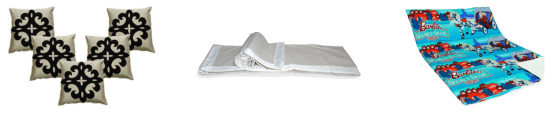

Baby


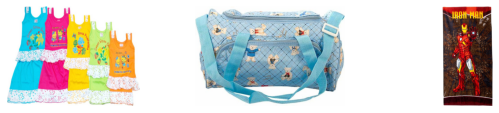

Watches


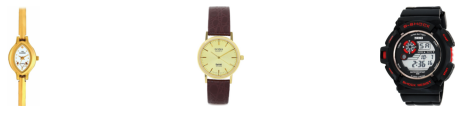

Decor


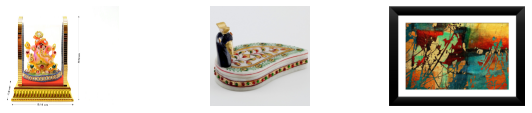

Kitchen


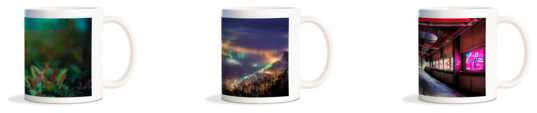

Beauty


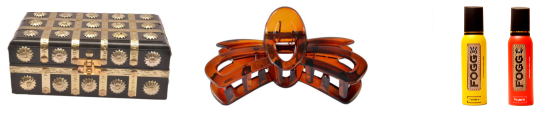

Computers


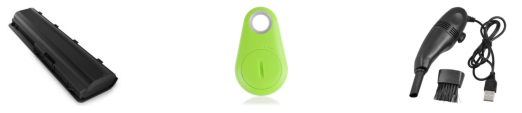

In [ ]:
from matplotlib.image import imread
list_labels=df_img["category"].unique()


for name in list_labels :
    plt.figure(figsize=(10,15))
    print("="*50)
    print('\033[1m' + name)
    print("="*50)
    for i in range(3):
        plt.subplot(7, 3, i + 1)
        for j in df_img[df_img["category"]==name].image.sample():
          filename = path + j
          image = imread(filename)
          plt.axis('off')
          plt.imshow(image)
         
    plt.show()
    

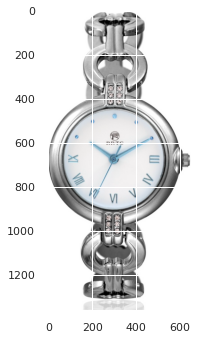

In [ ]:
import cv2
file = path + df_img["image"][777]
img_test = cv2.imread(file)
plt.imshow(img_test)

In [ ]:
# Récupérer et afficher la taille de l'image en pixels
print("Taille de la matrice de pixels : {} px".format(img_test.shape))

Taille de la matrice de pixels : (1360, 648, 3) px


## Détermination et affichage des descripteurs SIFT

* L'image contient 3098 descripteurs
* Chaque descripteur est un vecteur de longueur 128

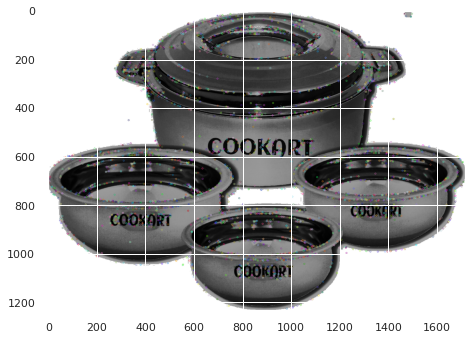

--------------------------------------------------
Descripteurs :  (3098, 128)
--------------------------------------------------
[[  4.   8.   2. ...   0.   0.   9.]
 [  3.   1.   1. ...   0.   0.   4.]
 [ 19.   2.   1. ...   0.   4.  56.]
 ...
 [ 56. 142.  49. ...   0.   0.   0.]
 [  5.   0.   0. ...   0.   0.   1.]
 [ 25.  10.   0. ...   0.   0.   1.]]


In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread(path+list_photos[1],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("-"*50)
print("Descripteurs : ", des.shape)
print("-"*50)
print(des)

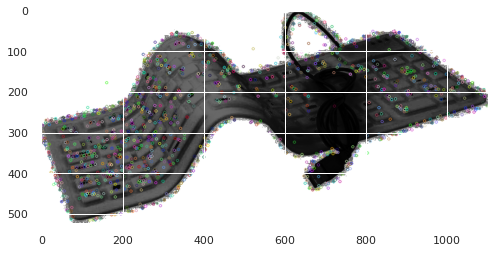

--------------------------------------------------
Descripteurs :  (1464, 128)
--------------------------------------------------
[[  1.  16. 117. ...   0.  22.  76.]
 [  0.   0.  11. ...  12.   1.   1.]
 [  5.  20.  20. ...   0.   0.  10.]
 ...
 [ 83.  68.  10. ...   0.   0.   8.]
 [  0.   0.   0. ...   3.   8.  15.]
 [ 10.   1.   1. ...   0.   0.   4.]]


In [ ]:
sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread(path+list_photos[2],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("-"*50)
print("Descripteurs : ", des.shape)
print("-"*50)
print(des)

# Pré-traitement des images via SIFT
Créations des descripteurs de chaque image


*   Pour chaque image passage en gris et equalisation
*   création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
*   création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs



In [ ]:
splits = np.array_split(list_photos, 4)
print("-"*50)
list1 = splits[0]
print(len(list1))
print("-"*50)
list2 = splits[1]
print(len(list2))
print("-"*50)
list3 = splits[2]
print(len(list3))
print("-"*50)
list4 = splits[3]
print(len(list4))

--------------------------------------------------
263
--------------------------------------------------
263
--------------------------------------------------
262
--------------------------------------------------
262


In [ ]:
# identification of key points and associated descriptors in list_photos
import time, cv2

temps1=time.time()
sift = cv2.xfeatures2d.SIFT_create(100)

sift_keypoints1 = []
for image_num in range(len(list1)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints1.append(des)

sift_keypoints2 = []
for image_num in range(len(list2)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints2.append(des)

sift_keypoints3 = []
for image_num in range(len(list3)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints3.append(des)

sift_keypoints4 = []
for image_num in range(len(list4)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints4.append(des)

sift_keypoints = (sift_keypoints1 + sift_keypoints2 + sift_keypoints3 + sift_keypoints4)

# Création d'une liste de descripteurs par image 
# (qui sera utilisée pour réaliser les histogrammes par image)
sift_keypoints_by_img = np.asarray(sift_keypoints)

# Création d'une liste de descripteurs pour toutes les images 
# (qui sera utilisée pour créer les clusters de descripteurs)
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print("-"*50)
print("Nombre de descripteurs : ", sift_keypoints_all.shape)
duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
0
100
200
0
100
200
0
100
200
--------------------------------------------------
Nombre de descripteurs :  (105356, 128)
temps de traitement SIFT descriptor :           602.69 secondes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


## Création des clusters de descripteurs
* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [ ]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

#k = int(round((len(sift_keypoints_all))/10,0))
k = 256
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  256
Création de 256 clusters de descripteurs ...
temps de traitement kmeans :             2.04 secondes


## Création des features des images
* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image

In [ ]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist

# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             0.90 secondes


## Réductions de dimension
### Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [ ]:
from sklearn import manifold, decomposition

print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 256)
Dimensions dataset après réduction PCA :  (1050, 163)


### Réduction de dimension T-SNE
* Réduction de dimension en 2 composantes T-SNE pour affichage en 2D des images

In [ ]:
import time

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters
def ARI_fct(features, perplexity) :
    time1 = time.time()
    num_labels=len(list_categories)
    tsne = manifold.TSNE(n_components=2, perplexity=perplexity, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(features)
    
    # Détermination des clusters à partir des données après Tsne 
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(true_labels, cls.labels_),4)
    df_img['cluster'] = cls.labels_
    time2 = np.round(time.time() - time1,0)
    print("ARI : ", ARI, "time : ", time2)
    
    return ARI, X_tsne, cls.labels_

# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, true_labels, labels, ARI) :
    fig = plt.figure(figsize=(18,7))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=true_labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=list_categories, loc="best", title="Categorie", fontsize = 9)
    plt.title('Représentation des descriptions par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels, cmap='Set1', s = 20)
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels), loc="best", title="Clusters", fontsize = 10)
    plt.title('Représentation des descriptions par clusters')
    
    plt.show()
    print("ARI : ", ARI)

ARI :  0.0039 time :  13.0


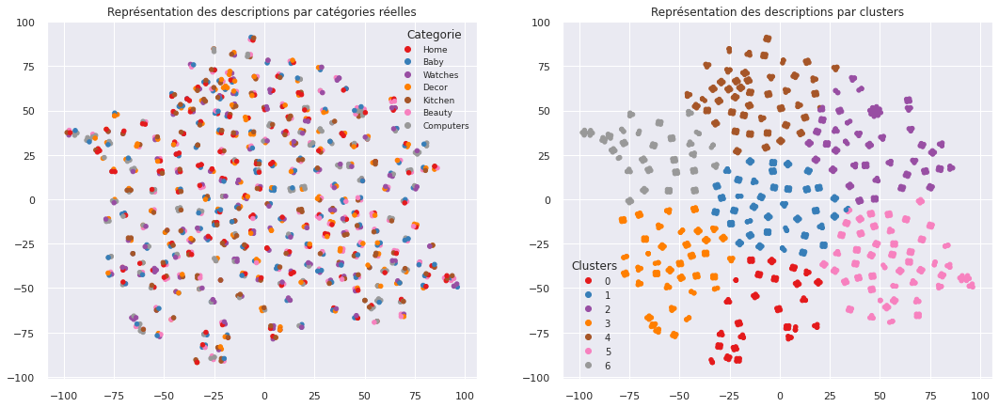

ARI :  0.0039


In [ ]:
# Execute clustering with perplexity 18 (argmax)
ARI, X_tsne, labels = ARI_fct(feat_pca, 18)

# tSNE vizualisation
TSNE_visu_fct(X_tsne, true_labels, labels, ARI)

In [ ]:
from sklearn import manifold, decomposition

tsne = manifold.TSNE(n_components=2, perplexity=30, 
                     n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = df_img["category"]
print(df_tsne.shape)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(1050, 3)


In [ ]:
df_tsne

,tsne1,tsne2,class
0,60.044685,15.318463,Home
1,34.907322,-22.742502,Baby
2,37.115364,-68.522888,Baby
3,-28.270407,26.936005,Home
4,-27.400681,23.170702,Home
...,...,...,...
1045,32.896133,-90.189346,Baby
1046,-34.275818,36.261627,Baby
1047,3.202540,-82.891602,Baby
1048,-39.094593,-61.672245,Baby


## Analyse visuelle : affichage T-SNE selon catégories d'images

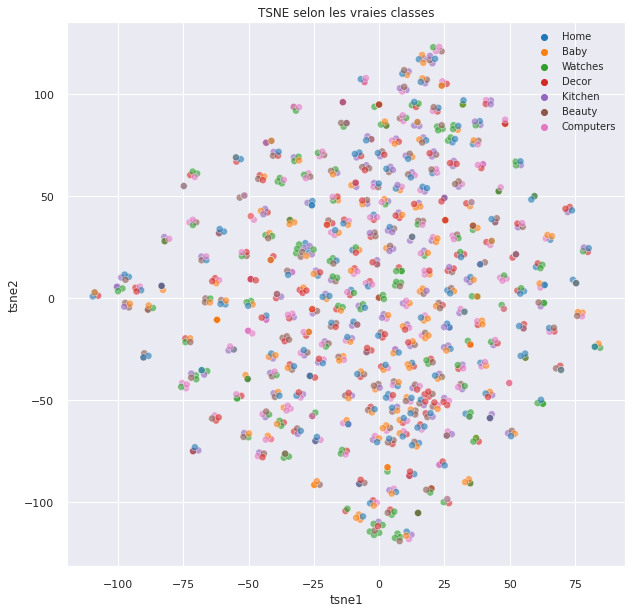

In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6)

plt.title('TSNE selon les vraies classes')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 10}) 

plt.show()

## Analyse mesures : similarité entre catégories et clusters
###  Création de clusters à partir du T-SNE

In [ ]:
from sklearn import cluster, metrics

cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

(1050, 4)


In [ ]:
df_tsne

,tsne1,tsne2,class,cluster
0,60.044685,15.318463,Home,3
1,34.907322,-22.742502,Baby,0
2,37.115364,-68.522888,Baby,0
3,-28.270407,26.936005,Home,1
4,-27.400681,23.170702,Home,1
...,...,...,...,...
1045,32.896133,-90.189346,Baby,5
1046,-34.275818,36.261627,Baby,1
1047,3.202540,-82.891602,Baby,5
1048,-39.094593,-61.672245,Baby,4


###  Affichage des images selon clusters et calcul ARI de similarité catégories images / clusters

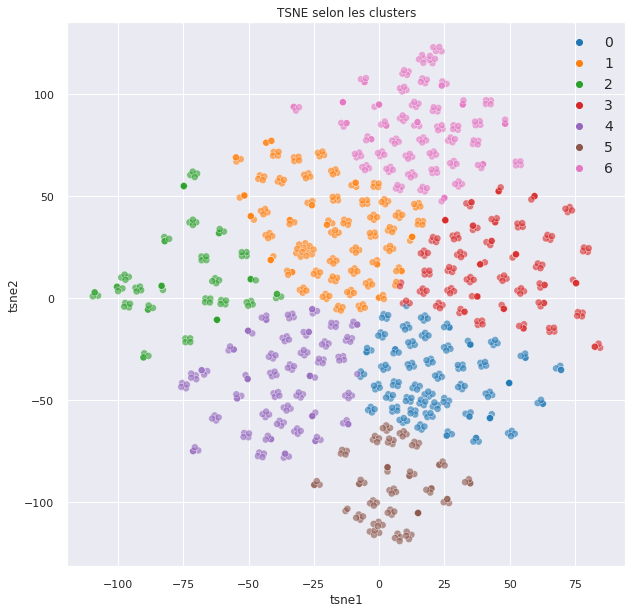

ARI :  0.001982616703917271


In [ ]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.6,
    data=df_tsne,
    legend="brief")


plt.title('TSNE selon les clusters')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.legend(prop={'size': 14}) 

plt.show()

labels = df_img["label"]
print("ARI : ", metrics.adjusted_rand_score(labels, cls.labels_))

### Analyse par classes
* La matrice de confusion doit être transformée pour mettre avoir en colonne le même ordre des catégories supposées qu'en ligne

In [ ]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    180
1    202
2     92
3    153
4    157
5     94
6    172
Name: class, dtype: int64

In [ ]:
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[30 31 11 27 17 18 16]
 [24 23 18 20 27 11 27]
 [24 27 11 24 31  9 24]
 [31 31 14 20 19 15 20]
 [31 24 14 23 19 12 27]
 [26 29 10 17 25  7 36]
 [14 37 14 22 19 22 22]]


In [ ]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    print ("Correspondance des clusters : ", corresp)
    #y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [3 6 1 0 2 6 5]
[[27 11 17 30  0 16 49]
 [20 18 27 24  0 27 34]
 [24 11 31 24  0 24 36]
 [20 14 19 31  0 20 46]
 [23 14 19 31  0 27 36]
 [17 10 25 26  0 36 36]
 [22 14 19 14  0 22 59]]

              precision    recall  f1-score   support

           0       0.18      0.18      0.18       150
           1       0.20      0.12      0.15       150
           2       0.20      0.21      0.20       150
           3       0.17      0.21      0.19       150
           4       0.00      0.00      0.00       150
           5       0.21      0.24      0.22       150
           6       0.20      0.39      0.26       150

    accuracy                           0.19      1050
   macro avg       0.16      0.19      0.17      1050
weighted avg       0.16      0.19      0.17      1050



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


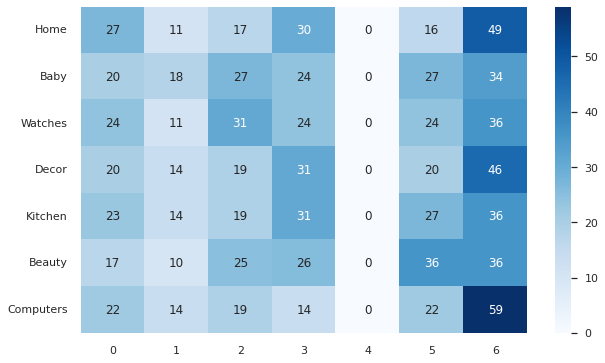

In [ ]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (10,6))
sns.heatmap(df_cm, annot=True, cmap="Blues")

# Tansfert learning CNN 

In [ ]:
from tensorflow import keras
from tensorflow.keras.models import Model
from keras.models import *

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

from keras.preprocessing import image
import tensorflow.keras.applications as apps
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import resnet50
from tensorflow.keras.applications.resnet50 import ResNet50 
from keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as ppss_efficientNetB0
from keras.applications.vgg16 import preprocess_input as ppss_vgg
from keras.applications.xception import preprocess_input as ppss_xce
from tensorflow.keras.applications.resnet50 import preprocess_input as ppss_resnet
from keras.applications.inception_v3 import preprocess_input as ppss_incep
from keras.applications.resnet_v2 import preprocess_input as ppss_restv2

In [ ]:
#Feature extraction
# 1- Créez un extracteur de caractéristiques pour extraire les caractéristiques des données.
# 2- Renvoie les caractéristiques extraites et l'extracteur de caractéristiques.

def get_features(model_name, data_preprocessor, input_size, data):
   
    #Prepare pipeline.
    input_layer = Input(input_size)
    preprocessor = Lambda(data_preprocessor)(input_layer)
    base_model = model_name(weights='imagenet', include_top=False, input_shape=input_size)(preprocessor)

    avg = GlobalAveragePooling2D()(base_model)
    feature_extractor = Model(inputs = input_layer, outputs = avg)

    #Extract feature.
    feature_maps = feature_extractor.predict(data, batch_size=64, verbose=1)
    print('Feature maps shape: ', feature_maps.shape)
    return feature_maps

In [ ]:
# Function to Extract features from the images
from keras.layers import BatchNormalization, Dense, GlobalAveragePooling2D, Lambda, Dropout, InputLayer, Input
from keras.preprocessing import image

def image_extract_feature(direc, preprocess, model, h, w):
    features = [];

    # extract features from each photo
    for name in df_img['image']:
        # load an image from file
        img = Image.open(path + name) # Lecture de l'image
        img = resize_pil(img, h, w) # Resize en 224*224
        
        # get features
        x = image.img_to_array(img)  #  convert the image pixels to a numpy array
        x = np.expand_dims(x, axis=0) # used to expand the shape of an array. Insert a new axis that will appear at the axis position in the expanded array shape.
        x = preprocess(x)

        resnet_feature = model.predict(x)
        resnet_feature_np = np.array(resnet_feature)
        features.append(resnet_feature_np.flatten())
    #features_np = np.array(features)
  
    return features

In [ ]:
# charger les modeles
model_EfficientNetB0 =  EfficientNetB0(include_top=False, weights='imagenet', pooling='avg')
model_vgg16 = VGG16(include_top=False, weights="imagenet", input_shape=(224,224,3))
model_restnet50 = ResNet50(include_top=False, weights="imagenet", input_shape=(224,224,3))

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
#presentation de mon structure
model_EfficientNetB0.summary()

In [ ]:
# Redimensionnez le rapport de maintien de l'image PIL et utilisez un fond blanc.
def resize_pil(im, target_width, target_height):       

    target_ratio = target_height / target_width
    im_ratio = im.height / im.width

    if target_ratio > im_ratio:
       # Il doit être fixé par la largeur
        resize_width = target_width
        resize_height = int(resize_width * im_ratio)
    else:
        # Fixé par hauteur
        resize_height = target_height
        resize_width = int(resize_height / im_ratio)

    image_resize = im.resize((resize_width, resize_height), Image.ANTIALIAS)
    background = Image.new('RGBA', (target_width, target_height), (255, 255, 255, 255))
    offset = (int((target_width - resize_width) / 2), int((target_height - resize_height) / 2))
    background.paste(image_resize, offset)
    return background.convert('RGB')

In [ ]:
def reduce(feature):
    umap= UMAP(n_components=3, init='random',random_state=15)
    proj_umap = umap.fit_transform(feature)

    pca = PCA(n_components= 95, random_state=15)
    feat_pca= pca.fit_transform(feature)

    Tsne = TSNE(n_components=3, init='random',random_state=15)
    proj_tsne = Tsne.fit_transform(feature)

    return proj_umap, feat_pca, proj_tsne

In [ ]:
def ari_model(features):
  proj_umap, feat_pca, proj_tsne = reduce(features)
  matrix=[proj_umap, feat_pca, proj_tsne]
  ARI=[]
  for mat in matrix:
    kmeans = KMeans(n_clusters=7, algorithm= 'auto', init= 'k-means++', random_state=15, max_iter=100, n_init=10).fit(mat)
    labels1 = kmeans.labels_
    ari = metrics.adjusted_rand_score(y_true, labels1)
    ARI.append(ari)
  return ARI

### EfficientNetB0

In [ ]:
temps1 =time.time()
# # Perform k-means clustering and vector quantization
features_EfficientNetB0 = image_extract_feature(path, ppss_efficientNetB0, model_EfficientNetB0, 224, 224)
duration1 = time.time()-temps1
print("temps de calculation de EfficientNetB0 : ", "%15.2f" % duration1, "secondes")

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


temps de calculation de EfficientNetB0 :           186.49 secondes


In [ ]:
ARI_EfficientNetB0 = ari_model(features_EfficientNetB0)
ARI_EfficientNetB0

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[0.4573183934049694, 0.5674383620059208, 0.45646892364425906]

### VGG-16

Le modèle pré-entraîné VGG-16 (poids ImageNet) a été utilisé pour détecter la probabilité que chaque image appartienne à une catégorie donnée.


In [ ]:
temps1 =time.time()
# # Perform k-means clustering and vector quantization
features_vgg16 = image_extract_feature(path, ppss_vgg, model_vgg16, 224, 224)
duration1 = time.time()-temps1
print("temps de calculation de VGG16 : ", "%15.2f" % duration1, "secondes")

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


temps de calculation de VGG16 :           749.72 secondes


In [ ]:
ARI_vgg = ari_model(features_vgg16)
ARI_vgg

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[0.24105251059337254, 0.13716110526031997, 0.24142454582731707]

### ResNet50

In [ ]:
temps1 =time.time()
# Perform k-means clustering and vector quantization
features_restnet50= image_extract_feature(path, ppss_resnet, model_restnet50, 224, 224)
duration5 = time.time()-temps1
print("temps de calculation de ResNet50 : ", "%15.2f" % duration5, "secondes")

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


temps de calculation de ResNet50 :           759.56 secondes


In [ ]:
ARI_resNet50 = ari_model(features_restnet50)
ARI_resNet50

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[0.384176620502895, 0.34773584096812016, 0.3488223633626378]

## Evaluation

In [ ]:
comp_ari=pd.DataFrame([ARI_EfficientNetB0, ARI_vgg, ARI_resNet50]
                    ,columns=['feat_pca','proj_umap', 'proj_tsne'],
                    index=['EfficientNetB0','VGG16','ResNet50'])

In [ ]:
comp_ari.round(2)

,feat_pca,proj_umap,proj_tsne
EfficientNetB0,0.46,0.57,0.46
VGG16,0.24,0.14,0.24
ResNet50,0.38,0.35,0.35


Text(0, 0.5, 'ARI Score')

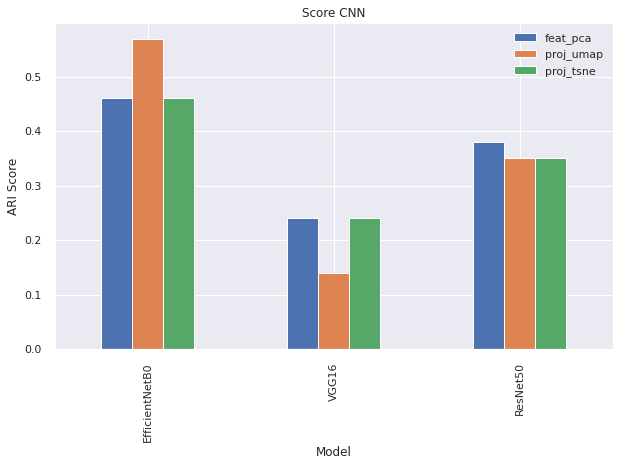

In [ ]:
comp_ari.round(2).plot(kind="bar",figsize=(10,6))
plt.title("Score CNN")
plt.xlabel("Model")
plt.ylabel("ARI Score")

### Analyse des clusters


In [ ]:
from sklearn.metrics import make_scorer,adjusted_rand_score
from sklearn.model_selection import GridSearchCV

km=KMeans(n_clusters=7)
score= make_scorer(adjusted_rand_score)

parameters = {'init':('k-means++', 'random'),
              'max_iter':[50,100,120],
              'n_init':[5,10,15],
              'algorithm':['auto', 'full', 'elkan'],
              'random_state': [20,25,30,40,60,]}

tsne = TSNE(n_components=2)
tsne_matrix = tsne.fit_transform(features_EfficientNetB0)

# Grid search
grid = GridSearchCV(km, parameters, scoring=score)
grid.fit(tsne_matrix, y_true)
index_grid=grid.cv_results_['rank_test_score'].tolist().index(1)
print("ARI score mean :"+ str(grid.cv_results_['mean_test_score'][index_grid]))
print("Best parameters: "+ str(grid.best_params_))

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


ARI score mean :0.586466981438084
Best parameters: {'algorithm': 'auto', 'init': 'random', 'max_iter': 50, 'n_init': 5, 'random_state': 20}


In [ ]:
tsne = TSNE(n_components=2)
tsne_matrix = tsne.fit_transform(features_EfficientNetB0)

kmeans = KMeans(n_clusters=7, algorithm='auto', init= 'random', max_iter=50, n_init= 15, random_state=20).fit(tsne_matrix)
labels_ts = kmeans.labels_

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [ ]:
print(" ARI : ",  round(metrics.adjusted_rand_score(y_true, labels_ts), 2))


 ARI :  0.53


In [ ]:
def plot_tsne_pca(matrix, title, labels):

# Dimensionality reduction using PCA,
    # reduce the tfidf matrix to just 2 features

    pca = PCA(n_components= 2, random_state=5).fit_transform(matrix)
    tsne = TSNE(n_components= 2, random_state=5).fit_transform(matrix)  

    #attaching the label to each 2D projection
    pca_data = np.vstack((pca.T,labels)).T
    pca_df = pd.DataFrame(pca_data, columns=['pca-one','pca-two','category'])

    tsne_data = np.vstack((tsne.T,labels)).T
    tsne_df = pd.DataFrame(tsne_data, columns=['tsne-one','tsne-two','category'])
   
    #idx = np.random.choice(range(pca.shape[0]),  size=500, replace=False)
    f, ax = plt.subplots(1, 2, figsize=(14, 6))

    sns.scatterplot(data=pca_df, x="pca-one", y="pca-two", hue='category',ax=ax[0])
    ax[0].set_title('PCA selon les catégories')
    
    sns.scatterplot(data=tsne_df, x="tsne-one", y="tsne-two", hue='category', ax=ax[1])
    ax[1].set_title('TSNE selon les clusters ')


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


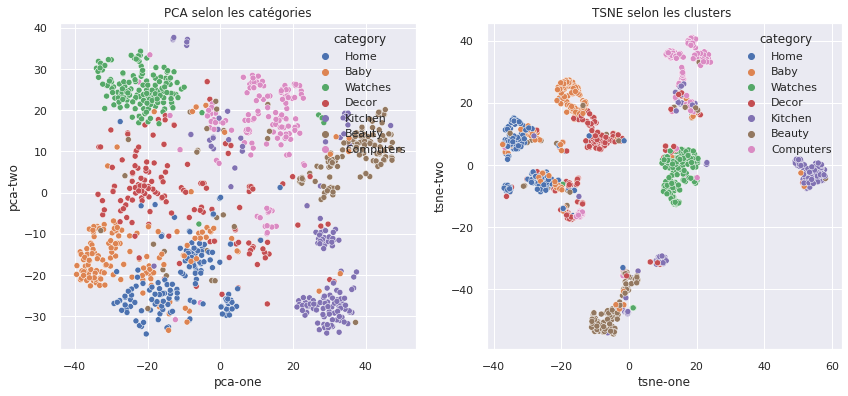

In [ ]:
plot_tsne_pca(tsne_matrix,'CNN_tsne',df_img['category'])

In [ ]:
df_img['cluster_tsne']= labels_ts
metrics.confusion_matrix(y_true, df_img['cluster_tsne'])


array([[ 84,   0,  57,   1,   7,   1,   0],
       [  1,   4,   0,   1,   0, 144,   0],
       [ 32,   2,   3,  13,  83,  10,   7],
       [ 22,   4, 108,   2,   8,   4,   2],
       [  7, 122,   6,   8,   5,   1,   1],
       [ 16,   2,   1, 127,   1,   3,   0],
       [  0,  14,   1,  16,   0,   9, 110]])

In [ ]:
np.argmax(metrics.confusion_matrix(y_true, df_img['cluster_tsne']), axis=0)

array([0, 4, 3, 5, 2, 1, 6])

In [ ]:
conf_mat =metrics.confusion_matrix(y_true, df_img['cluster_tsne'])
corresp = np.argmax(conf_mat, axis=0)
labels = pd.Series(y_true, name="y_true").to_frame()

labels['y_pred_transform'] = df_img['cluster_tsne'].apply(lambda x : corresp[x])


conf_mat = metrics.confusion_matrix(y_true, labels['y_pred_transform'])
conf_mat

array([[ 84,   1,   7,  57,   0,   1,   0],
       [  1, 144,   0,   0,   4,   1,   0],
       [ 32,  10,  83,   3,   2,  13,   7],
       [ 22,   4,   8, 108,   4,   2,   2],
       [  7,   1,   5,   6, 122,   8,   1],
       [ 16,   3,   1,   1,   2, 127,   0],
       [  0,   9,   0,   1,  14,  16, 110]])

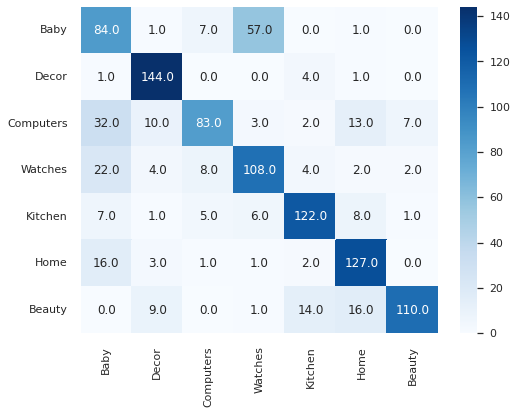

In [ ]:
from keras.layers import Flatten,Dense,BatchNormalization,Activation,Dropout
list_labels=['Baby','Decor','Computers','Watches','Kitchen','Home','Beauty']
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels], columns = [label for label in list_labels])
plt.figure(figsize = (8,6))
sns.heatmap(df_cm, annot=True, fmt='.1f', cmap="Blues")


In [ ]:
print(metrics.classification_report(y_true, labels['y_pred_transform']))


              precision    recall  f1-score   support

           0       0.52      0.56      0.54       150
           1       0.84      0.96      0.89       150
           2       0.80      0.55      0.65       150
           3       0.61      0.72      0.66       150
           4       0.82      0.81      0.82       150
           5       0.76      0.85      0.80       150
           6       0.92      0.73      0.81       150

    accuracy                           0.74      1050
   macro avg       0.75      0.74      0.74      1050
weighted avg       0.75      0.74      0.74      1050



/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


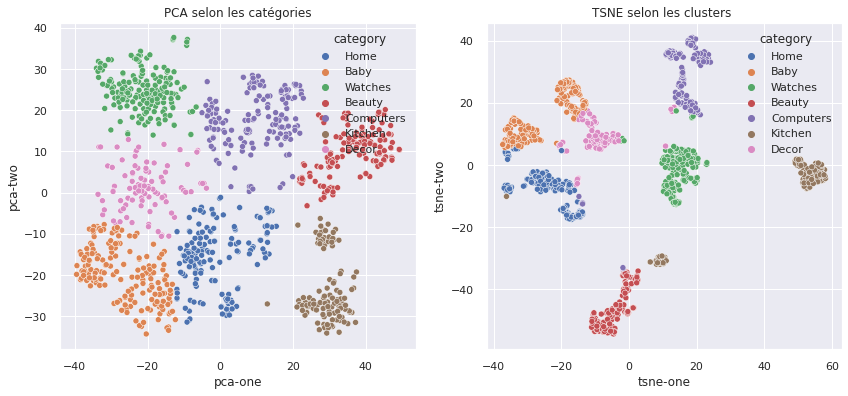

In [ ]:
cluster  = {0: 'Home',
            1: 'Watches',
            2: 'Decor',
            3: 'Baby',
            4: 'Beauty',
            5: 'Computers',
            6: 'Kitchen'}

labels_transform = labels['y_pred_transform'].map(cluster)
plot_tsne_pca(tsne_matrix,'CNN_tsne_cluster', labels_transform)

In [ ]:
df_img['cluster_tsne']= labels_transform


Home


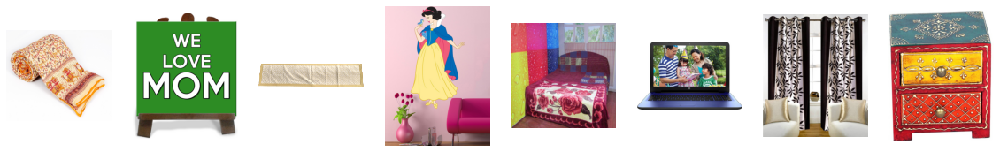

-------
Baby


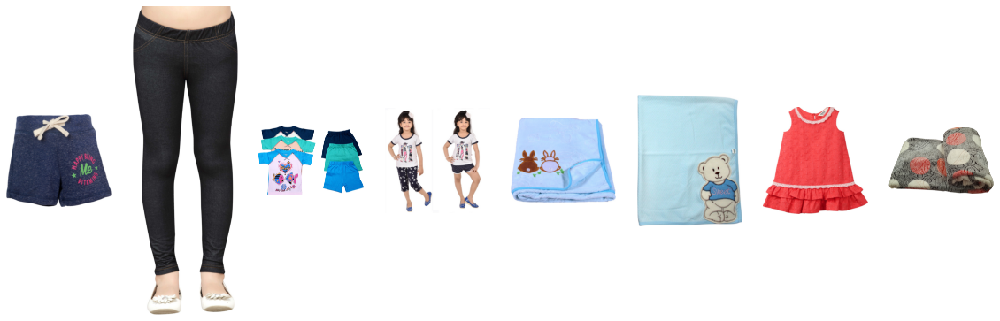

-------
Watches


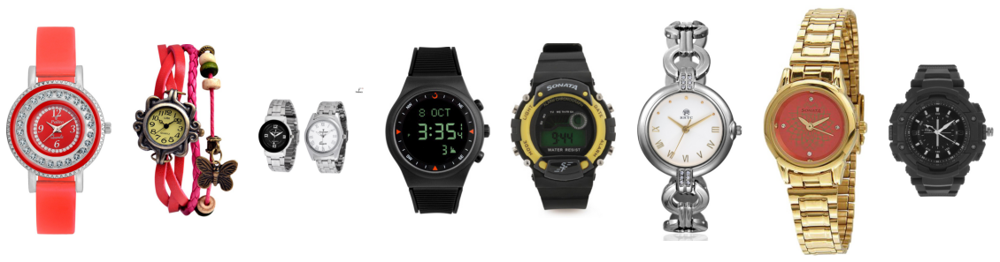

-------
Beauty


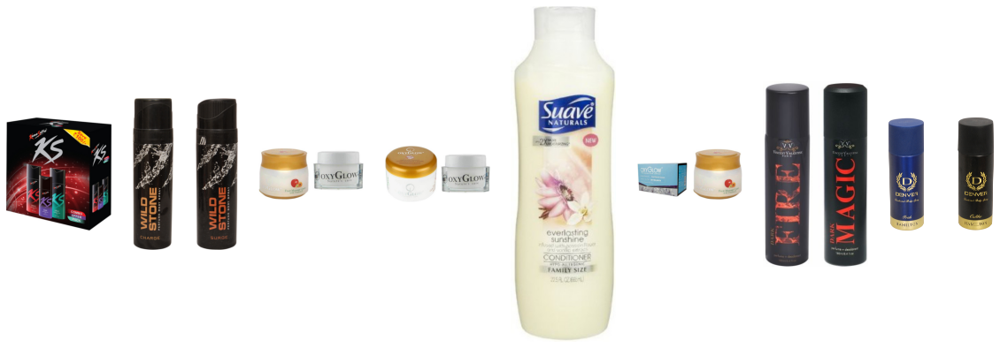

-------
Computers


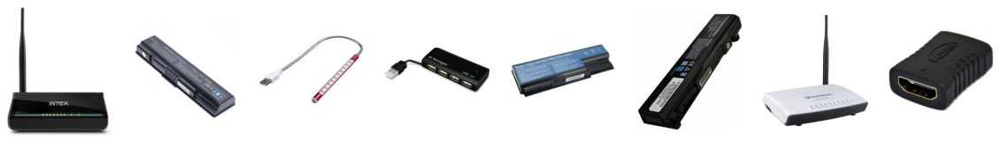

-------
Kitchen


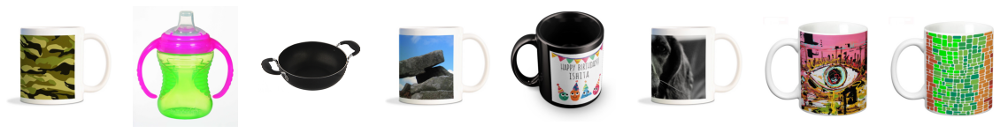

-------
Decor


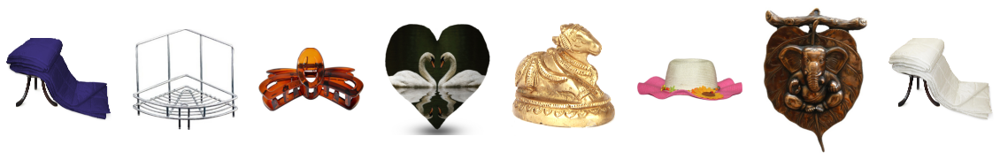

-------


In [ ]:
list_labels= df_img['cluster_tsne'].unique()
path = "/content/drive/MyDrive/DS_P6/Flipkart/Images/"

#plt.figure(figsize=(12,12))
for name in list_labels :
    plt.figure(figsize=(20,10))

    print(name)
    # print("-------")
    for i in range(8):
        plt.subplot(180 + 1 + i)
        for j in df_img[df_img['cluster_tsne']==name].image.sample(3):
          filename = path + j
          image = imread(filename)
          plt.axis('off')
          plt.imshow(image)
    plt.show()
    print("-------")